# Assignment 2: CRF sequence tagging for Movie Queries

This coursework involves optimizing the performance of a Conditional Random Field (CRF) sequence tagger for movie trivia questions and answers data, which consist of instances of data of word sequences with the target classes/labels for each word in a BIO (Beginning, Inside, Outside) tagging format. 

This assignment involves reading in, pre-processing, training and developing your tagger on the training data from trivia10k13train.bio.txt, and finally testing your tagger on the data trivia10k13test.bio.txt, attempting to get the best performing tagger across the different labels in your development process. Parts of these steps have been done for you already. You are going to optimize the performance of the tagger by improving its feature extraction function on the word sequences. Run and follow the code below and then attempt the questions.

In [1]:
import os
import sys

from copy import deepcopy
from collections import Counter
from nltk.tag import CRFTagger

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report

from matplotlib import pyplot as plt
import numpy as np

import re
import unicodedata

In [2]:
conda install -c conda-forge python-crfsuite

Note: you may need to restart the kernel to use updated packages.
Solving environment: ...working... done

# All requested packages already installed.




In [3]:
def get_raw_data_from_bio_file(fpath):
    """A simple function to read in from a one-word-per-line BIO
    (Beginning, Inside, Outside) tagged corpus, tab separated
    and each example sentence/text separated with a blank line.
    The data is already tokenized in a simple way.
    e.g.:
    
    B-Actor	steve
    I-Actor	mcqueen
    O	provided
    O	a
    B-Plot	thrilling
    I-Plot	motorcycle
    I-Plot	chase
    I-Plot	in
    I-Plot	this
    B-Opinion	greatest
    I-Opinion	of
    I-Opinion	all
    B-Plot	ww
    I-Plot	2
    I-Plot	prison
    I-Plot	escape
    I-Plot	movies
    
    returns a list of lists of tuples of (word, tag) tuples
    """
    f = open(fpath)
    data = []  # the data, a list of lists of (word, tag) tuples
    current_sent = []  # data for current sentence/example
    for line in f:
        if line == "\n":  # each instance has a blank line separating it from next one
            # solution
            data.append(current_sent)
            current_sent = []
            continue
        line_data = line.strip("\n").split("\t")
        current_sent.append((line_data[1], line_data[0]))
    f.close()
    return data

In [4]:
raw_training_data = get_raw_data_from_bio_file("trivia10k13train.bio.txt")

In [5]:
# have a look at the first example
print(raw_training_data[0])

[('steve', 'B-Actor'), ('mcqueen', 'I-Actor'), ('provided', 'O'), ('a', 'O'), ('thrilling', 'B-Plot'), ('motorcycle', 'I-Plot'), ('chase', 'I-Plot'), ('in', 'I-Plot'), ('this', 'I-Plot'), ('greatest', 'B-Opinion'), ('of', 'I-Opinion'), ('all', 'I-Opinion'), ('ww', 'B-Plot'), ('2', 'I-Plot'), ('prison', 'I-Plot'), ('escape', 'I-Plot'), ('movies', 'I-Plot')]


In [6]:
raw_test_data = get_raw_data_from_bio_file("trivia10k13test.bio.txt")

In [7]:
# have a look at the first example
print(raw_test_data[0])

[('i', 'O'), ('need', 'O'), ('that', 'O'), ('movie', 'O'), ('which', 'O'), ('involves', 'O'), ('aliens', 'B-Plot'), ('invading', 'I-Plot'), ('earth', 'I-Plot'), ('in', 'I-Plot'), ('a', 'I-Plot'), ('particular', 'I-Plot'), ('united', 'I-Plot'), ('states', 'I-Plot'), ('place', 'I-Plot'), ('in', 'I-Plot'), ('california', 'I-Plot')]


In [7]:
print(len(raw_training_data), "instances")
print(sum([len(sent) for sent in raw_training_data]), "words")

7816 instances
158823 words


In [8]:
print(len(raw_test_data), "instances")
print(sum([len(sent) for sent in raw_test_data]), "words")

1953 instances
39035 words


In [27]:
# list created with length of raw training data
alist = [[] for _ in range(len(raw_training_data))]
train_tagged = np.empty(len(raw_training_data), object)
train_tagged[:]= alist
train_tagged


def preProcess_train(e, example):
    """Function takes in list of (word, bio-tag) pairs, e.g.:
        [('steve', 'B-Actor'), ('mcqueen', 'I-Actor'), ('provided', 'O'),
        ('a', 'O'), ('thrilling', 'B-Plot'), ('motorcycle', 'I-Plot'),
        ('chase', 'I-Plot'), ('in', 'I-Plot'), ('this', 'I-Plot'),
        ('greatest', 'B-Opinion'), ('of', 'I-Opinion'), ('all', 'I-Opinion'),
        ('ww', 'B-Plot'), ('2', 'I-Plot'), ('prison', 'I-Plot'),
        ('escape', 'I-Plot'), ('movies', 'I-Plot')]
        
    returns new (token, bio-tag) pairs with preprocessing applied to the words"""
    # POS tagging words
    posttagger = CRFTagger()
    posttagger.set_model_file("crf_pos.tagger")
    words = [w[0] for w in example]
    BIO = [b[1] for b in example]
    tags = posttagger.tag(words)
    # word + @ + POS tag appended to train_tagged along with the respective BIO tag 
    for i, t in enumerate(tags): 
            train_tagged[e].append((t[0]+'@'+t[1], BIO[i]))
        

In [28]:
[preProcess_train(e, example) for e, example in enumerate(raw_training_data)]
TrainingData = train_tagged

In [29]:
TrainingData

array([list([('steve@PRPVBP', 'B-Actor'), ('mcqueen@VBN', 'I-Actor'), ('provided@VBN', 'O'), ('a@DT', 'O'), ('thrilling@NN', 'B-Plot'), ('motorcycle@NN', 'I-Plot'), ('chase@NN', 'I-Plot'), ('in@IN', 'I-Plot'), ('this@DT', 'I-Plot'), ('greatest@JJS', 'B-Opinion'), ('of@IN', 'I-Opinion'), ('all@DT', 'I-Opinion'), ('ww@NNP', 'B-Plot'), ('2@NNP', 'I-Plot'), ('prison@NNP', 'I-Plot'), ('escape@NN', 'I-Plot'), ('movies@NNS', 'I-Plot')]),
       list([('liza@NNP', 'B-Actor'), ('minnelli@NNP', 'I-Actor'), ('and@CC', 'O'), ('joel@NNP', 'B-Actor'), ('gray@NNP', 'I-Actor'), ('won@NNP', 'B-Award'), ('oscars@NNS', 'I-Award'), ('for@IN', 'O'), ('their@PRP$', 'O'), ('roles@NNS', 'O'), ('in@IN', 'O'), ('this@DT', 'O'), ('1972@NN', 'B-Year'), ('movie@NN', 'O'), ('that@WDT', 'B-Plot'), ('follows@VBZ', 'I-Plot'), ('nightclub@NN', 'I-Plot'), ('entertainers@NNS', 'I-Plot'), ('in@IN', 'I-Plot'), ('berlin@NNP', 'I-Plot'), ('as@IN', 'I-Plot'), ('the@DT', 'I-Plot'), ('nazis@NNS', 'I-Plot'), ('come@VBP', 'I-Plot

In [30]:
# list created with length of raw test data
alist = [[] for _ in range(len(raw_test_data))]
test_tagged = np.empty(len(raw_test_data), object)
test_tagged[:]= alist
test_tagged

def preProcess_test(e, example):
    """Function takes in list of (word, bio-tag) pairs, e.g.:
        [('steve', 'B-Actor'), ('mcqueen', 'I-Actor'), ('provided', 'O'),
        ('a', 'O'), ('thrilling', 'B-Plot'), ('motorcycle', 'I-Plot'),
        ('chase', 'I-Plot'), ('in', 'I-Plot'), ('this', 'I-Plot'),
        ('greatest', 'B-Opinion'), ('of', 'I-Opinion'), ('all', 'I-Opinion'),
        ('ww', 'B-Plot'), ('2', 'I-Plot'), ('prison', 'I-Plot'),
        ('escape', 'I-Plot'), ('movies', 'I-Plot')]
        
    returns new (token, bio-tag) pairs with preprocessing applied to the words"""
    # POS tagging words
    posttagger = CRFTagger()
    posttagger.set_model_file("crf_pos.tagger")
    words = [w[0] for w in example]
    BIO = [b[1] for b in example]
    tags = posttagger.tag(words)
    # word + @ + POS tag appended to test_tagged along with the respective BIO tag
    for i, t in enumerate(tags): 
        test_tagged[e].append((t[0]+'@'+t[1], BIO[i]))

        

In [31]:
[preProcess_test(e, example) for e, example in enumerate(raw_test_data)]
TestData = test_tagged

In [32]:
TestData

array([list([('i@PRP', 'O'), ('need@VBP', 'O'), ('that@DT', 'O'), ('movie@NN', 'O'), ('which@WDT', 'O'), ('involves@VBZ', 'O'), ('aliens@NNPPOS', 'B-Plot'), ('invading@NNP', 'I-Plot'), ('earth@NNP', 'I-Plot'), ('in@IN', 'I-Plot'), ('a@DT', 'I-Plot'), ('particular@JJ', 'I-Plot'), ('united@NNP', 'I-Plot'), ('states@NNPS', 'I-Plot'), ('place@NN', 'I-Plot'), ('in@IN', 'I-Plot'), ('california@NNP', 'I-Plot')]),
       list([('what@WP', 'O'), ('soviet@NNP', 'B-Genre'), ('science@NNP', 'I-Genre'), ('fiction@NN', 'I-Genre'), ('classic@NN', 'B-Opinion'), ('about@IN', 'O'), ('a@DT', 'B-Plot'), ('mysterious@JJ', 'I-Plot'), ('planet@NN', 'I-Plot'), ('was@VBD', 'O'), ('later@RB', 'O'), ('remade@VB', 'B-Relationship'), ('by@IN', 'O'), ('steven@NNP', 'B-Director'), ('soderbergh@NNP', 'I-Director'), ('and@CC', 'O'), ('george@NNP', 'B-Actor'), ('clooney@NNP', 'I-Actor')]),
       list([('this@DT', 'O'), ('american@JJ', 'B-Genre'), ('classic@NN', 'I-Genre'), ('based@VBN', 'O'), ('on@IN', 'O'), ('margare

In [17]:
# check the effect of pre-processing
TrainingData[5]

[('what@WP', 'O'),
 ('1981@NNP', 'B-Year'),
 ('feature@NNP', 'O'),
 ('film@NNP', 'O'),
 ('starring@NNP', 'O'),
 ('mel@NNP', 'B-Actor'),
 ('gibson@NNP', 'I-Actor'),
 ('takes@VBZ', 'B-Plot'),
 ('place@NN', 'I-Plot'),
 ('in@IN', 'I-Plot'),
 ('a@DT', 'I-Plot'),
 ('post@RBS', 'I-Plot'),
 ('apocalyptic@JJ', 'I-Plot'),
 ('world@NN', 'I-Plot'),
 ('in@IN', 'I-Plot'),
 ('australia@NNP', 'I-Plot')]

In [18]:
_pattern = re.compile(r"\d")  # to recognize numbers/digits

# This is the 'out-of-the-box' get_features function from the nltk CRF tagger
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx].split('@')[0]
    POStag = tokens[idx].split('@')[1]
    feature_list = []

    if not token:
        return feature_list

    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")
        
    # Bi-gram of previous and current word
    bi = 'none'
    try:
        bi = (tokens[idx-1] + " " + tokens[idx])
    except:
        pass

    feature_list.append(bi)
    
    # Tri-gram of previous, current and concurrent word
    tri = 'none'
    try:
        tri = (tokens[idx-1] + " " + tokens[idx] + " " + tokens[idx+1])
    except:
        pass

    feature_list.append(tri)
    
    # 4-gram of previous, current and concurrent 2 words
    quad = 'none'
    try:
        quad = (tokens[idx-1] + " " + tokens[idx] + " " + tokens[idx+1] + " " + tokens[idx+2])
    except:
        pass

    feature_list.append(quad)

    # 5-gram of previous, current and concurrent 3 words
#     pent = 'none'
#     try:
#         pent = (tokens[idx-1] + " " + tokens[idx] + " " + tokens[idx+1] + " " + tokens[idx+2] + " " + tokens[idx+3])
#     except:
#         pass

#     feature_list.append(pent)


    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    feature_list.append("WORD_" + token)
    
    #prefix up to length 5
    if len(token) > 1:
        feature_list.append("PRE_" + token[:1])
    if len(token) > 2:
        feature_list.append("PRE_" + token[:2])
    if len(token) > 3:
        feature_list.append("PRE_" + token[:3])
    if len(token) > 2:
        feature_list.append("PRE_" + token[:4])
    if len(token) > 3:
        feature_list.append("PRE_" + token[:5])
    
    # POS tag
    feature_list.append("POS_" + POStag)
    
    #print(tokens)
    print(feature_list)
    
    return feature_list

In [19]:
# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("training tagger...")
ct.train(TrainingData, TAGGER_PATH)
print("done")

training tagger...
['movies@NNS steve@PRPVBP', 'movies@NNS steve@PRPVBP mcqueen@VBN', 'movies@NNS steve@PRPVBP mcqueen@VBN provided@VBN', 'SUF_e', 'SUF_ve', 'SUF_eve', 'SUF_teve', 'WORD_steve', 'PRE_s', 'PRE_st', 'PRE_ste', 'PRE_stev', 'PRE_steve', 'POS_PRPVBP']
['steve@PRPVBP mcqueen@VBN', 'steve@PRPVBP mcqueen@VBN provided@VBN', 'steve@PRPVBP mcqueen@VBN provided@VBN a@DT', 'SUF_n', 'SUF_en', 'SUF_een', 'SUF_ueen', 'SUF_queen', 'WORD_mcqueen', 'PRE_m', 'PRE_mc', 'PRE_mcq', 'PRE_mcqu', 'PRE_mcque', 'POS_VBN']
['mcqueen@VBN provided@VBN', 'mcqueen@VBN provided@VBN a@DT', 'mcqueen@VBN provided@VBN a@DT thrilling@NN', 'SUF_d', 'SUF_ed', 'SUF_ded', 'SUF_ided', 'SUF_vided', 'WORD_provided', 'PRE_p', 'PRE_pr', 'PRE_pro', 'PRE_prov', 'PRE_provi', 'POS_VBN']
['provided@VBN a@DT', 'provided@VBN a@DT thrilling@NN', 'provided@VBN a@DT thrilling@NN motorcycle@NN', 'WORD_a', 'POS_DT']
['a@DT thrilling@NN', 'a@DT thrilling@NN motorcycle@NN', 'a@DT thrilling@NN motorcycle@NN chase@NN', 'SUF_g', 'SUF

['from@IN certain@JJ', 'from@IN certain@JJ death@NN', 'from@IN certain@JJ death@NN during@IN', 'SUF_n', 'SUF_in', 'SUF_ain', 'SUF_tain', 'SUF_rtain', 'WORD_certain', 'PRE_c', 'PRE_ce', 'PRE_cer', 'PRE_cert', 'PRE_certa', 'POS_JJ']
['certain@JJ death@NN', 'certain@JJ death@NN during@IN', 'certain@JJ death@NN during@IN the@DT', 'SUF_h', 'SUF_th', 'SUF_ath', 'SUF_eath', 'WORD_death', 'PRE_d', 'PRE_de', 'PRE_dea', 'PRE_deat', 'PRE_death', 'POS_NN']
['death@NN during@IN', 'death@NN during@IN the@DT', 'death@NN during@IN the@DT holocaust@NN', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ring', 'SUF_uring', 'WORD_during', 'PRE_d', 'PRE_du', 'PRE_dur', 'PRE_duri', 'PRE_durin', 'POS_IN']
['during@IN the@DT', 'during@IN the@DT holocaust@NN', 'none', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT holocaust@NN', 'none', 'none', 'SUF_t', 'SUF_st', 'SUF_ust', 'SUF_aust', 'SUF_caust', 'WORD_holocaust', 'PRE_h', 'PRE_ho', 'PRE_hol', 'PRE_holo', 'PRE_holoc', 'POS_NN']
['brooks@NN

['players@NNS to@TO', 'players@NNS to@TO form@VB', 'players@NNS to@TO form@VB a@DT', 'SUF_o', 'WORD_to', 'PRE_t', 'POS_TO']
['to@TO form@VB', 'to@TO form@VB a@DT', 'to@TO form@VB a@DT winning@NN', 'SUF_m', 'SUF_rm', 'SUF_orm', 'WORD_form', 'PRE_f', 'PRE_fo', 'PRE_for', 'PRE_form', 'PRE_form', 'POS_VB']
['form@VB a@DT', 'form@VB a@DT winning@NN', 'form@VB a@DT winning@NN team@NN', 'WORD_a', 'POS_DT']
['a@DT winning@NN', 'a@DT winning@NN team@NN', 'none', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ning', 'SUF_nning', 'WORD_winning', 'PRE_w', 'PRE_wi', 'PRE_win', 'PRE_winn', 'PRE_winni', 'POS_NN']
['winning@NN team@NN', 'none', 'none', 'SUF_m', 'SUF_am', 'SUF_eam', 'WORD_team', 'PRE_t', 'PRE_te', 'PRE_tea', 'PRE_team', 'PRE_team', 'POS_NN']
['road@NN what@WP', 'road@NN what@WP is@VBZ', 'road@NN what@WP is@VBZ the@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP is@VBZ', 'what@WP is@VBZ the@DT', 'what@WP is@VBZ the@DT movie@N

['animated@JJ film@NN', 'animated@JJ film@NN that@WDT', 'animated@JJ film@NN that@WDT is@VBZ', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil', 'PRE_film', 'PRE_film', 'POS_NN']
['film@NN that@WDT', 'film@NN that@WDT is@VBZ', 'film@NN that@WDT is@VBZ based@VBN', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_that', 'PRE_t', 'PRE_th', 'PRE_tha', 'PRE_that', 'PRE_that', 'POS_WDT']
['that@WDT is@VBZ', 'that@WDT is@VBZ based@VBN', 'that@WDT is@VBZ based@VBN on@IN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ based@VBN', 'is@VBZ based@VBN on@IN', 'is@VBZ based@VBN on@IN the@DT', 'SUF_d', 'SUF_ed', 'SUF_sed', 'SUF_ased', 'WORD_based', 'PRE_b', 'PRE_ba', 'PRE_bas', 'PRE_base', 'PRE_based', 'POS_VBN']
['based@VBN on@IN', 'based@VBN on@IN the@DT', 'based@VBN on@IN the@DT character@NN', 'SUF_n', 'WORD_on', 'PRE_o', 'POS_IN']
['on@IN the@DT', 'on@IN the@DT character@NN', 'on@IN the@DT character@NN created@VBD', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT

['he@PRP has@VBZ', 'he@PRP has@VBZ a@DT', 'he@PRP has@VBZ a@DT mysterious@JJ', 'SUF_s', 'SUF_as', 'WORD_has', 'PRE_h', 'PRE_ha', 'PRE_has', 'POS_VBZ']
['has@VBZ a@DT', 'has@VBZ a@DT mysterious@JJ', 'has@VBZ a@DT mysterious@JJ gift@NN', 'WORD_a', 'POS_DT']
['a@DT mysterious@JJ', 'a@DT mysterious@JJ gift@NN', 'none', 'SUF_s', 'SUF_us', 'SUF_ous', 'SUF_ious', 'SUF_rious', 'WORD_mysterious', 'PRE_m', 'PRE_my', 'PRE_mys', 'PRE_myst', 'PRE_myste', 'POS_JJ']
['mysterious@JJ gift@NN', 'none', 'none', 'SUF_t', 'SUF_ft', 'SUF_ift', 'WORD_gift', 'PRE_g', 'PRE_gi', 'PRE_gif', 'PRE_gift', 'PRE_gift', 'POS_NN']
['house@NN this@DT', 'house@NN this@DT pixar@NN', 'house@NN this@DT pixar@NN movie@NN', 'SUF_s', 'SUF_is', 'SUF_his', 'WORD_this', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_this', 'PRE_this', 'POS_DT']
['this@DT pixar@NN', 'this@DT pixar@NN movie@NN', 'this@DT pixar@NN movie@NN has@VBZ', 'SUF_r', 'SUF_ar', 'SUF_xar', 'SUF_ixar', 'WORD_pixar', 'PRE_p', 'PRE_pi', 'PRE_pix', 'PRE_pixa', 'PRE_pixar', 'P

['that@WDT is@VBZ', 'that@WDT is@VBZ a@DT', 'that@WDT is@VBZ a@DT twisted@JJ', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ a@DT', 'is@VBZ a@DT twisted@JJ', 'is@VBZ a@DT twisted@JJ take@NN', 'WORD_a', 'POS_DT']
['a@DT twisted@JJ', 'a@DT twisted@JJ take@NN', 'a@DT twisted@JJ take@NN on@IN', 'SUF_d', 'SUF_ed', 'SUF_ted', 'SUF_sted', 'SUF_isted', 'WORD_twisted', 'PRE_t', 'PRE_tw', 'PRE_twi', 'PRE_twis', 'PRE_twist', 'POS_JJ']
['twisted@JJ take@NN', 'twisted@JJ take@NN on@IN', 'twisted@JJ take@NN on@IN the@DT', 'SUF_e', 'SUF_ke', 'SUF_ake', 'WORD_take', 'PRE_t', 'PRE_ta', 'PRE_tak', 'PRE_take', 'PRE_take', 'POS_NN']
['take@NN on@IN', 'take@NN on@IN the@DT', 'take@NN on@IN the@DT ballet@NNP', 'SUF_n', 'WORD_on', 'PRE_o', 'POS_IN']
['on@IN the@DT', 'on@IN the@DT ballet@NNP', 'on@IN the@DT ballet@NNP swan@NNP', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT ballet@NNP', 'the@DT ballet@NNP swan@NNP', 'the@DT ballet@NNP swan@NNP lake@NNP', 'SUF_t', 'SUF_et',

['what@WP steven@NNP', 'what@WP steven@NNP spielberg@NNP', 'what@WP steven@NNP spielberg@NNP blockbuster@NNP', 'SUF_n', 'SUF_en', 'SUF_ven', 'SUF_even', 'SUF_teven', 'WORD_steven', 'PRE_s', 'PRE_st', 'PRE_ste', 'PRE_stev', 'PRE_steve', 'POS_NNP']
['steven@NNP spielberg@NNP', 'steven@NNP spielberg@NNP blockbuster@NNP', 'steven@NNP spielberg@NNP blockbuster@NNP movie@NN', 'SUF_g', 'SUF_rg', 'SUF_erg', 'SUF_berg', 'SUF_lberg', 'WORD_spielberg', 'PRE_s', 'PRE_sp', 'PRE_spi', 'PRE_spie', 'PRE_spiel', 'POS_NNP']
['spielberg@NNP blockbuster@NNP', 'spielberg@NNP blockbuster@NNP movie@NN', 'spielberg@NNP blockbuster@NNP movie@NN did@VBD', 'SUF_r', 'SUF_er', 'SUF_ter', 'SUF_ster', 'SUF_uster', 'WORD_blockbuster', 'PRE_b', 'PRE_bl', 'PRE_blo', 'PRE_bloc', 'PRE_block', 'POS_NNP']
['blockbuster@NNP movie@NN', 'blockbuster@NNP movie@NN did@VBD', 'blockbuster@NNP movie@NN did@VBD the@DT', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'P

['kyle@NNP machlachlan@NNP', 'kyle@NNP machlachlan@NNP as@IN', 'kyle@NNP machlachlan@NNP as@IN he@PRP', 'SUF_n', 'SUF_an', 'SUF_lan', 'SUF_hlan', 'SUF_chlan', 'WORD_machlachlan', 'PRE_m', 'PRE_ma', 'PRE_mac', 'PRE_mach', 'PRE_machl', 'POS_NNP']
['machlachlan@NNP as@IN', 'machlachlan@NNP as@IN he@PRP', 'machlachlan@NNP as@IN he@PRP attempts@VBZ', 'SUF_s', 'WORD_as', 'PRE_a', 'POS_IN']
['as@IN he@PRP', 'as@IN he@PRP attempts@VBZ', 'as@IN he@PRP attempts@VBZ to@TO', 'SUF_e', 'WORD_he', 'PRE_h', 'POS_PRP']
['he@PRP attempts@VBZ', 'he@PRP attempts@VBZ to@TO', 'he@PRP attempts@VBZ to@TO solve@VB', 'SUF_s', 'SUF_ts', 'SUF_pts', 'SUF_mpts', 'SUF_empts', 'WORD_attempts', 'PRE_a', 'PRE_at', 'PRE_att', 'PRE_atte', 'PRE_attem', 'POS_VBZ']
['attempts@VBZ to@TO', 'attempts@VBZ to@TO solve@VB', 'attempts@VBZ to@TO solve@VB the@DT', 'SUF_o', 'WORD_to', 'PRE_t', 'POS_TO']
['to@TO solve@VB', 'to@TO solve@VB the@DT', 'to@TO solve@VB the@DT mystery@NN', 'SUF_e', 'SUF_ve', 'SUF_lve', 'SUF_olve', 'WORD_solv

['what@WP is@VBZ', 'what@WP is@VBZ this@DT', 'what@WP is@VBZ this@DT disney@NNP', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ this@DT', 'is@VBZ this@DT disney@NNP', 'is@VBZ this@DT disney@NNP classic@NNP', 'SUF_s', 'SUF_is', 'SUF_his', 'WORD_this', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_this', 'PRE_this', 'POS_DT']
['this@DT disney@NNP', 'this@DT disney@NNP classic@NNP', 'this@DT disney@NNP classic@NNP about@IN', 'SUF_y', 'SUF_ey', 'SUF_ney', 'SUF_sney', 'SUF_isney', 'WORD_disney', 'PRE_d', 'PRE_di', 'PRE_dis', 'PRE_disn', 'PRE_disne', 'POS_NNP']
['disney@NNP classic@NNP', 'disney@NNP classic@NNP about@IN', 'disney@NNP classic@NNP about@IN a@DT', 'SUF_c', 'SUF_ic', 'SUF_sic', 'SUF_ssic', 'SUF_assic', 'WORD_classic', 'PRE_c', 'PRE_cl', 'PRE_cla', 'PRE_clas', 'PRE_class', 'POS_NNP']
['classic@NNP about@IN', 'classic@NNP about@IN a@DT', 'classic@NNP about@IN a@DT puppet@NN', 'SUF_t', 'SUF_ut', 'SUF_out', 'SUF_bout', 'WORD_about', 'PRE_a', 'PRE_ab', 'PRE_abo', 'PRE_abou', 'PRE_about', 'PO

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['jamie@NNP foxx@NNP', 'jamie@NNP foxx@NNP in@IN', 'jamie@NNP foxx@NNP in@IN which@WDT', 'SUF_x', 'SUF_xx', 'SUF_oxx', 'WORD_foxx', 'PRE_f', 'PRE_fo', 'PRE_fox', 'PRE_foxx', 'PRE_foxx', 'POS_NNP']
['foxx@NNP in@IN', 'foxx@NNP in@IN which@WDT', 'foxx@NNP in@IN which@WDT he@PRP', 'SUF_n', 'WORD_in', 'PRE_i', 'POS_IN']
['in@IN which@WDT', 'in@IN which@WDT he@PRP', 'in@IN which@WDT he@PRP plays@VBZ', 'SUF_h', 'SUF_ch', 'SUF_ich', 'SUF_hich', 'WORD_which', 'PRE_w', 'PRE_wh', 'PRE_whi', 'PRE_whic', 'PRE_which', 'POS_WDT']
['which@WDT he@PRP', 'which@WDT he@PRP plays@VBZ', 'which@WDT he@PRP plays@VBZ a@DT', 'SUF_e', 'WORD_he', 'PRE_h', 'POS_PRP']
['he@PRP plays@VBZ', 'he@PRP plays@VBZ a@DT', 'he@PRP plays@VBZ a@DT blind@NN', 'SUF_s', 'SUF_ys', 'SUF_ays', 'SUF_lays', 'WORD_plays', 'PRE_p', 'PRE_pl', 'PRE_pla', 'PRE_play', 'PRE_plays', 'POS_VBZ']
['plays@VBZ a@DT', 'plays@VBZ a@DT blind@NN', 'plays@VBZ a@DT blind@NN piano@NN', 'WORD_a', 'POS_DT']
['a@DT blind@NN', 'a@DT blind@NN piano@NN', 'a@

['what@WDT movie@NN', 'what@WDT movie@NN features@NNS', 'what@WDT movie@NN features@NNS the@DT', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN features@NNS', 'movie@NN features@NNS the@DT', 'movie@NN features@NNS the@DT arrival@NN', 'SUF_s', 'SUF_es', 'SUF_res', 'SUF_ures', 'SUF_tures', 'WORD_features', 'PRE_f', 'PRE_fe', 'PRE_fea', 'PRE_feat', 'PRE_featu', 'POS_NNS']
['features@NNS the@DT', 'features@NNS the@DT arrival@NN', 'features@NNS the@DT arrival@NN of@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT arrival@NN', 'the@DT arrival@NN of@IN', 'the@DT arrival@NN of@IN a@DT', 'SUF_l', 'SUF_al', 'SUF_val', 'SUF_ival', 'SUF_rival', 'WORD_arrival', 'PRE_a', 'PRE_ar', 'PRE_arr', 'PRE_arri', 'PRE_arriv', 'POS_NN']
['arrival@NN of@IN', 'arrival@NN of@IN a@DT', 'arrival@NN of@IN a@DT flying@NN', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN a@DT', 'of@IN a@DT flying@NN'

['a@DT grown@JJ', 'a@DT grown@JJ man@NN', 'a@DT grown@JJ man@NN naked@VBD', 'SUF_n', 'SUF_wn', 'SUF_own', 'SUF_rown', 'WORD_grown', 'PRE_g', 'PRE_gr', 'PRE_gro', 'PRE_grow', 'PRE_grown', 'POS_JJ']
['grown@JJ man@NN', 'grown@JJ man@NN naked@VBD', 'none', 'SUF_n', 'SUF_an', 'WORD_man', 'PRE_m', 'PRE_ma', 'PRE_man', 'POS_NN']
['man@NN naked@VBD', 'none', 'none', 'SUF_d', 'SUF_ed', 'SUF_ked', 'SUF_aked', 'WORD_naked', 'PRE_n', 'PRE_na', 'PRE_nak', 'PRE_nake', 'PRE_naked', 'POS_VBD']
['HAS_NUM', 'style@NN 1992@NNP', 'style@NN 1992@NNP tarantino@NNP', 'style@NN 1992@NNP tarantino@NNP debut@NNP', 'SUF_2', 'SUF_92', 'SUF_992', 'WORD_1992', 'PRE_1', 'PRE_19', 'PRE_199', 'PRE_1992', 'PRE_1992', 'POS_NNP']
['1992@NNP tarantino@NNP', '1992@NNP tarantino@NNP debut@NNP', '1992@NNP tarantino@NNP debut@NNP about@IN', 'SUF_o', 'SUF_no', 'SUF_ino', 'SUF_tino', 'SUF_ntino', 'WORD_tarantino', 'PRE_t', 'PRE_ta', 'PRE_tar', 'PRE_tara', 'PRE_taran', 'POS_NNP']
['tarantino@NNP debut@NNP', 'tarantino@NNP debut

['ending@NN of@IN', 'ending@NN of@IN the@DT', 'ending@NN of@IN the@DT lovers@NNS', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN the@DT', 'of@IN the@DT lovers@NNS', 'of@IN the@DT lovers@NNS at@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT lovers@NNS', 'the@DT lovers@NNS at@IN', 'the@DT lovers@NNS at@IN the@DT', 'SUF_s', 'SUF_rs', 'SUF_ers', 'SUF_vers', 'SUF_overs', 'WORD_lovers', 'PRE_l', 'PRE_lo', 'PRE_lov', 'PRE_love', 'PRE_lover', 'POS_NNS']
['lovers@NNS at@IN', 'lovers@NNS at@IN the@DT', 'lovers@NNS at@IN the@DT end@NN', 'SUF_t', 'WORD_at', 'PRE_a', 'POS_IN']
['at@IN the@DT', 'at@IN the@DT end@NN', 'none', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT end@NN', 'none', 'none', 'SUF_d', 'SUF_nd', 'WORD_end', 'PRE_e', 'PRE_en', 'PRE_end', 'POS_NN']
['on@IN a@DT', 'on@IN a@DT scary@JJ', 'on@IN a@DT scary@JJ movie@NN', 'WORD_a', 'POS_DT']
['a@DT scary@JJ', 'a@DT scary@JJ movie@NN', 'a@DT scary@JJ movie@NN which@WD

['lovers@NNS torn@JJ', 'lovers@NNS torn@JJ apart@NN', 'lovers@NNS torn@JJ apart@NN by@IN', 'SUF_n', 'SUF_rn', 'SUF_orn', 'WORD_torn', 'PRE_t', 'PRE_to', 'PRE_tor', 'PRE_torn', 'PRE_torn', 'POS_JJ']
['torn@JJ apart@NN', 'torn@JJ apart@NN by@IN', 'torn@JJ apart@NN by@IN their@PRP$', 'SUF_t', 'SUF_rt', 'SUF_art', 'SUF_part', 'WORD_apart', 'PRE_a', 'PRE_ap', 'PRE_apa', 'PRE_apar', 'PRE_apart', 'POS_NN']
['apart@NN by@IN', 'apart@NN by@IN their@PRP$', 'apart@NN by@IN their@PRP$ political@JJ', 'SUF_y', 'WORD_by', 'PRE_b', 'POS_IN']
['by@IN their@PRP$', 'by@IN their@PRP$ political@JJ', 'by@IN their@PRP$ political@JJ views@NNS', 'SUF_r', 'SUF_ir', 'SUF_eir', 'SUF_heir', 'WORD_their', 'PRE_t', 'PRE_th', 'PRE_the', 'PRE_thei', 'PRE_their', 'POS_PRP$']
['their@PRP$ political@JJ', 'their@PRP$ political@JJ views@NNS', 'none', 'SUF_l', 'SUF_al', 'SUF_cal', 'SUF_ical', 'SUF_tical', 'WORD_political', 'PRE_p', 'PRE_po', 'PRE_pol', 'PRE_poli', 'PRE_polit', 'POS_JJ']
['political@JJ views@NNS', 'none', 'n

['coopers@NNS find@VB', 'coopers@NNS find@VB me@PRP', 'coopers@NNS find@VB me@PRP a@DT', 'SUF_d', 'SUF_nd', 'SUF_ind', 'WORD_find', 'PRE_f', 'PRE_fi', 'PRE_fin', 'PRE_find', 'PRE_find', 'POS_VB']
['find@VB me@PRP', 'find@VB me@PRP a@DT', 'find@VB me@PRP a@DT movie@NN', 'SUF_e', 'WORD_me', 'PRE_m', 'POS_PRP']
['me@PRP a@DT', 'me@PRP a@DT movie@NN', 'me@PRP a@DT movie@NN starring@VBG', 'WORD_a', 'POS_DT']
['a@DT movie@NN', 'a@DT movie@NN starring@VBG', 'a@DT movie@NN starring@VBG mark@NNP', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN starring@VBG', 'movie@NN starring@VBG mark@NNP', 'movie@NN starring@VBG mark@NNP wohlberg@NNP', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ring', 'SUF_rring', 'WORD_starring', 'PRE_s', 'PRE_st', 'PRE_sta', 'PRE_star', 'PRE_starr', 'POS_VBG']
['starring@VBG mark@NNP', 'starring@VBG mark@NNP wohlberg@NNP', 'starring@VBG mark@NNP wohlberg@NNP who@WP', 'SUF_k', 'SUF_rk', 'SUF_ark', '

['d@NNP which@WDT', 'd@NNP which@WDT the@DT', 'd@NNP which@WDT the@DT main@JJ', 'SUF_h', 'SUF_ch', 'SUF_ich', 'SUF_hich', 'WORD_which', 'PRE_w', 'PRE_wh', 'PRE_whi', 'PRE_whic', 'PRE_which', 'POS_WDT']
['which@WDT the@DT', 'which@WDT the@DT main@JJ', 'which@WDT the@DT main@JJ character@NN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT main@JJ', 'the@DT main@JJ character@NN', 'the@DT main@JJ character@NN is@VBZ', 'SUF_n', 'SUF_in', 'SUF_ain', 'WORD_main', 'PRE_m', 'PRE_ma', 'PRE_mai', 'PRE_main', 'PRE_main', 'POS_JJ']
['main@JJ character@NN', 'main@JJ character@NN is@VBZ', 'main@JJ character@NN is@VBZ a@DT', 'SUF_r', 'SUF_er', 'SUF_ter', 'SUF_cter', 'SUF_acter', 'WORD_character', 'PRE_c', 'PRE_ch', 'PRE_cha', 'PRE_char', 'PRE_chara', 'POS_NN']
['character@NN is@VBZ', 'character@NN is@VBZ a@DT', 'character@NN is@VBZ a@DT lizard@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ a@DT', 'is@VBZ a@DT lizard@NN', 'none', 'WORD_a', 'POS_DT']
['a@DT lizard

['i@PRP m@VBP', 'i@PRP m@VBP thinking@VBG', 'i@PRP m@VBP thinking@VBG of@IN', 'WORD_m', 'POS_VBP']
['m@VBP thinking@VBG', 'm@VBP thinking@VBG of@IN', 'm@VBP thinking@VBG of@IN that@DT', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_king', 'SUF_nking', 'WORD_thinking', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_thin', 'PRE_think', 'POS_VBG']
['thinking@VBG of@IN', 'thinking@VBG of@IN that@DT', 'thinking@VBG of@IN that@DT 1995@NNP', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN that@DT', 'of@IN that@DT 1995@NNP', 'of@IN that@DT 1995@NNP neo@NNP', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_that', 'PRE_t', 'PRE_th', 'PRE_tha', 'PRE_that', 'PRE_that', 'POS_DT']
['HAS_NUM', 'that@DT 1995@NNP', 'that@DT 1995@NNP neo@NNP', 'that@DT 1995@NNP neo@NNP noir@NNP', 'SUF_5', 'SUF_95', 'SUF_995', 'WORD_1995', 'PRE_1', 'PRE_19', 'PRE_199', 'PRE_1995', 'PRE_1995', 'POS_NNP']
['1995@NNP neo@NNP', '1995@NNP neo@NNP noir@NNP', '1995@NNP neo@NNP noir@NNP film@NNP', 'SUF_o', 'SUF_eo', 'WORD_neo', 'PRE_n', 'PRE_ne', 'PRE_neo', 'POS_N

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['on@IN being@VBG', 'on@IN being@VBG a@DT', 'on@IN being@VBG a@DT superhero@NN', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_eing', 'WORD_being', 'PRE_b', 'PRE_be', 'PRE_bei', 'PRE_bein', 'PRE_being', 'POS_VBG']
['being@VBG a@DT', 'being@VBG a@DT superhero@NN', 'being@VBG a@DT superhero@NN he@PRP', 'WORD_a', 'POS_DT']
['a@DT superhero@NN', 'a@DT superhero@NN he@PRP', 'a@DT superhero@NN he@PRP found@VBD', 'SUF_o', 'SUF_ro', 'SUF_ero', 'SUF_hero', 'SUF_rhero', 'WORD_superhero', 'PRE_s', 'PRE_su', 'PRE_sup', 'PRE_supe', 'PRE_super', 'POS_NN']
['superhero@NN he@PRP', 'superhero@NN he@PRP found@VBD', 'superhero@NN he@PRP found@VBD a@DT', 'SUF_e', 'WORD_he', 'PRE_h', 'POS_PRP']
['he@PRP found@VBD', 'he@PRP found@VBD a@DT', 'he@PRP found@VBD a@DT spaceship@NN', 'SUF_d', 'SUF_nd', 'SUF_und', 'SUF_ound', 'WORD_found', 'PRE_f', 'PRE_fo', 'PRE_fou', 'PRE_foun', 'PRE_found', 'POS_VBD']
['found@VBD a@DT', 'found@VBD a@DT spaceship@NN', 'found@VBD a@DT spaceship@NN glowing@VBG', 'WORD_a', 'POS_DT']
['a@DT s

['life@NN what@WP', 'life@NN what@WP s@PDT', 'life@NN what@WP s@PDT the@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP s@PDT', 'what@WP s@PDT the@DT', 'what@WP s@PDT the@DT loopy@NN', 'WORD_s', 'POS_PDT']
['s@PDT the@DT', 's@PDT the@DT loopy@NN', 's@PDT the@DT loopy@NN crime@NN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT loopy@NN', 'the@DT loopy@NN crime@NN', 'the@DT loopy@NN crime@NN film@NN', 'SUF_y', 'SUF_py', 'SUF_opy', 'SUF_oopy', 'WORD_loopy', 'PRE_l', 'PRE_lo', 'PRE_loo', 'PRE_loop', 'PRE_loopy', 'POS_NN']
['loopy@NN crime@NN', 'loopy@NN crime@NN film@NN', 'loopy@NN crime@NN film@NN where@WRB', 'SUF_e', 'SUF_me', 'SUF_ime', 'SUF_rime', 'WORD_crime', 'PRE_c', 'PRE_cr', 'PRE_cri', 'PRE_crim', 'PRE_crime', 'POS_NN']
['crime@NN film@NN', 'crime@NN film@NN where@WRB', 'crime@NN film@NN where@WRB a@DT', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil'

['s@PDT the@DT', 's@PDT the@DT road@NN', 's@PDT the@DT road@NN trip@NN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT road@NN', 'the@DT road@NN trip@NN', 'the@DT road@NN trip@NN movie@NN', 'SUF_d', 'SUF_ad', 'SUF_oad', 'WORD_road', 'PRE_r', 'PRE_ro', 'PRE_roa', 'PRE_road', 'PRE_road', 'POS_NN']
['road@NN trip@NN', 'road@NN trip@NN movie@NN', 'road@NN trip@NN movie@NN where@WRB', 'SUF_p', 'SUF_ip', 'SUF_rip', 'WORD_trip', 'PRE_t', 'PRE_tr', 'PRE_tri', 'PRE_trip', 'PRE_trip', 'POS_NN']
['trip@NN movie@NN', 'trip@NN movie@NN where@WRB', 'trip@NN movie@NN where@WRB a@DT', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN where@WRB', 'movie@NN where@WRB a@DT', 'movie@NN where@WRB a@DT mismatched@JJ', 'SUF_e', 'SUF_re', 'SUF_ere', 'SUF_here', 'WORD_where', 'PRE_w', 'PRE_wh', 'PRE_whe', 'PRE_wher', 'PRE_where', 'POS_WRB']
['where@WRB a@DT', 'where@WRB a@DT mismatched@JJ', 'wher

['and@CC penelope@NNP', 'and@CC penelope@NNP allen@NNP', 'none', 'SUF_e', 'SUF_pe', 'SUF_ope', 'SUF_lope', 'SUF_elope', 'WORD_penelope', 'PRE_p', 'PRE_pe', 'PRE_pen', 'PRE_pene', 'PRE_penel', 'POS_NNP']
['penelope@NNP allen@NNP', 'none', 'none', 'SUF_n', 'SUF_en', 'SUF_len', 'SUF_llen', 'WORD_allen', 'PRE_a', 'PRE_al', 'PRE_all', 'PRE_alle', 'PRE_allen', 'POS_NNP']
['friendship@NN what@WP', 'friendship@NN what@WP 1996@NNP', 'friendship@NN what@WP 1996@NNP movie@NNP', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['HAS_NUM', 'what@WP 1996@NNP', 'what@WP 1996@NNP movie@NNP', 'what@WP 1996@NNP movie@NNP featuring@NNP', 'SUF_6', 'SUF_96', 'SUF_996', 'WORD_1996', 'PRE_1', 'PRE_19', 'PRE_199', 'PRE_1996', 'PRE_1996', 'POS_NNP']
['1996@NNP movie@NNP', '1996@NNP movie@NNP featuring@NNP', '1996@NNP movie@NNP featuring@NNP paul@NNP', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_

['up@RP against@IN', 'up@RP against@IN international@JJ', 'up@RP against@IN international@JJ assassins@NNS', 'SUF_t', 'SUF_st', 'SUF_nst', 'SUF_inst', 'SUF_ainst', 'WORD_against', 'PRE_a', 'PRE_ag', 'PRE_aga', 'PRE_agai', 'PRE_again', 'POS_IN']
['against@IN international@JJ', 'against@IN international@JJ assassins@NNS', 'against@IN international@JJ assassins@NNS hunting@VBG', 'SUF_l', 'SUF_al', 'SUF_nal', 'SUF_onal', 'SUF_ional', 'WORD_international', 'PRE_i', 'PRE_in', 'PRE_int', 'PRE_inte', 'PRE_inter', 'POS_JJ']
['international@JJ assassins@NNS', 'international@JJ assassins@NNS hunting@VBG', 'international@JJ assassins@NNS hunting@VBG down@IN', 'SUF_s', 'SUF_ns', 'SUF_ins', 'SUF_sins', 'SUF_ssins', 'WORD_assassins', 'PRE_a', 'PRE_as', 'PRE_ass', 'PRE_assa', 'PRE_assas', 'POS_NNS']
['assassins@NNS hunting@VBG', 'assassins@NNS hunting@VBG down@IN', 'assassins@NNS hunting@VBG down@IN a@DT', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ting', 'SUF_nting', 'WORD_hunting', 'PRE_h', 'PRE_hu', 'PRE_h

['war@NNP ii@NNP', 'none', 'none', 'SUF_i', 'WORD_ii', 'PRE_i', 'POS_NNP']
['power@NN what@WP', 'power@NN what@WP classic@JJ', 'power@NN what@WP classic@JJ movie@NN', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP classic@JJ', 'what@WP classic@JJ movie@NN', 'what@WP classic@JJ movie@NN stars@NNS', 'SUF_c', 'SUF_ic', 'SUF_sic', 'SUF_ssic', 'SUF_assic', 'WORD_classic', 'PRE_c', 'PRE_cl', 'PRE_cla', 'PRE_clas', 'PRE_class', 'POS_JJ']
['classic@JJ movie@NN', 'classic@JJ movie@NN stars@NNS', 'classic@JJ movie@NN stars@NNS a@DT', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN stars@NNS', 'movie@NN stars@NNS a@DT', 'movie@NN stars@NNS a@DT man@NN', 'SUF_s', 'SUF_rs', 'SUF_ars', 'SUF_tars', 'WORD_stars', 'PRE_s', 'PRE_st', 'PRE_sta', 'PRE_star', 'PRE_stars', 'POS_NNS']
['stars@NNS a@DT', 'stars@NNS a@DT man@NN', 'stars@NNS a@DT man@NN who@WP

['iconic@NNP film@NNP', 'iconic@NNP film@NNP starring@NNP', 'iconic@NNP film@NNP starring@NNP james@NNP', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil', 'PRE_film', 'PRE_film', 'POS_NNP']
['film@NNP starring@NNP', 'film@NNP starring@NNP james@NNP', 'film@NNP starring@NNP james@NNP stewart@NNP', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ring', 'SUF_rring', 'WORD_starring', 'PRE_s', 'PRE_st', 'PRE_sta', 'PRE_star', 'PRE_starr', 'POS_NNP']
['starring@NNP james@NNP', 'starring@NNP james@NNP stewart@NNP', 'starring@NNP james@NNP stewart@NNP and@CC', 'SUF_s', 'SUF_es', 'SUF_mes', 'SUF_ames', 'WORD_james', 'PRE_j', 'PRE_ja', 'PRE_jam', 'PRE_jame', 'PRE_james', 'POS_NNP']
['james@NNP stewart@NNP', 'james@NNP stewart@NNP and@CC', 'james@NNP stewart@NNP and@CC donna@NNP', 'SUF_t', 'SUF_rt', 'SUF_art', 'SUF_wart', 'SUF_ewart', 'WORD_stewart', 'PRE_s', 'PRE_st', 'PRE_ste', 'PRE_stew', 'PRE_stewa', 'POS_NNP']
['stewart@NNP and@CC', 'stewart@NNP and@CC donna@NNP', 'stewart@NNP and

['on@IN a@DT', 'on@IN a@DT doomed@JJ', 'on@IN a@DT doomed@JJ ship@NN', 'WORD_a', 'POS_DT']
['a@DT doomed@JJ', 'a@DT doomed@JJ ship@NN', 'none', 'SUF_d', 'SUF_ed', 'SUF_med', 'SUF_omed', 'SUF_oomed', 'WORD_doomed', 'PRE_d', 'PRE_do', 'PRE_doo', 'PRE_doom', 'PRE_doome', 'POS_JJ']
['doomed@JJ ship@NN', 'none', 'none', 'SUF_p', 'SUF_ip', 'SUF_hip', 'WORD_ship', 'PRE_s', 'PRE_sh', 'PRE_shi', 'PRE_ship', 'PRE_ship', 'POS_NN']
['pitt@NNP what@WP', 'pitt@NNP what@WP is@VBZ', 'pitt@NNP what@WP is@VBZ a@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP is@VBZ', 'what@WP is@VBZ a@DT', 'what@WP is@VBZ a@DT movie@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ a@DT', 'is@VBZ a@DT movie@NN', 'is@VBZ a@DT movie@NN that@WDT', 'WORD_a', 'POS_DT']
['a@DT movie@NN', 'a@DT movie@NN that@WDT', 'a@DT movie@NN that@WDT centers@NNS', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'P

['cyborg@NN even@RB', 'cyborg@NN even@RB though@RB', 'cyborg@NN even@RB though@RB he@PRP', 'SUF_n', 'SUF_en', 'SUF_ven', 'WORD_even', 'PRE_e', 'PRE_ev', 'PRE_eve', 'PRE_even', 'PRE_even', 'POS_RB']
['even@RB though@RB', 'even@RB though@RB he@PRP', 'even@RB though@RB he@PRP he@PRP', 'SUF_h', 'SUF_gh', 'SUF_ugh', 'SUF_ough', 'SUF_hough', 'WORD_though', 'PRE_t', 'PRE_th', 'PRE_tho', 'PRE_thou', 'PRE_thoug', 'POS_RB']
['though@RB he@PRP', 'though@RB he@PRP he@PRP', 'though@RB he@PRP he@PRP tasked@VBD', 'SUF_e', 'WORD_he', 'PRE_h', 'POS_PRP']
['he@PRP he@PRP', 'he@PRP he@PRP tasked@VBD', 'he@PRP he@PRP tasked@VBD with@IN', 'SUF_e', 'WORD_he', 'PRE_h', 'POS_PRP']
['he@PRP tasked@VBD', 'he@PRP tasked@VBD with@IN', 'he@PRP tasked@VBD with@IN killing@VBG', 'SUF_d', 'SUF_ed', 'SUF_ked', 'SUF_sked', 'SUF_asked', 'WORD_tasked', 'PRE_t', 'PRE_ta', 'PRE_tas', 'PRE_task', 'PRE_taske', 'POS_VBD']
['tasked@VBD with@IN', 'tasked@VBD with@IN killing@VBG', 'tasked@VBD with@IN killing@VBG cyborgs@NNS', 'SU

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['what@WP was@VBD', 'what@WP was@VBD the@DT', 'what@WP was@VBD the@DT 2010@NN', 'SUF_s', 'SUF_as', 'WORD_was', 'PRE_w', 'PRE_wa', 'PRE_was', 'POS_VBD']
['was@VBD the@DT', 'was@VBD the@DT 2010@NN', 'was@VBD the@DT 2010@NN found@VBD', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['HAS_NUM', 'the@DT 2010@NN', 'the@DT 2010@NN found@VBD', 'the@DT 2010@NN found@VBD footage@NN', 'SUF_0', 'SUF_10', 'SUF_010', 'WORD_2010', 'PRE_2', 'PRE_20', 'PRE_201', 'PRE_2010', 'PRE_2010', 'POS_NN']
['2010@NN found@VBD', '2010@NN found@VBD footage@NN', '2010@NN found@VBD footage@NN film@NN', 'SUF_d', 'SUF_nd', 'SUF_und', 'SUF_ound', 'WORD_found', 'PRE_f', 'PRE_fo', 'PRE_fou', 'PRE_foun', 'PRE_found', 'POS_VBD']
['found@VBD footage@NN', 'found@VBD footage@NN film@NN', 'found@VBD footage@NN film@NN featuring@VBG', 'SUF_e', 'SUF_ge', 'SUF_age', 'SUF_tage', 'SUF_otage', 'WORD_footage', 'PRE_f', 'PRE_fo', 'PRE_foo', 'PRE_foot', 'PRE_foota', 'POS_NN']
['footage@NN film@NN', 'footage@NN f

['directed@VBN by@IN', 'directed@VBN by@IN tim@NNP', 'directed@VBN by@IN tim@NNP burton@NNP', 'SUF_y', 'WORD_by', 'PRE_b', 'POS_IN']
['by@IN tim@NNP', 'by@IN tim@NNP burton@NNP', 'by@IN tim@NNP burton@NNP and@CC', 'SUF_m', 'SUF_im', 'WORD_tim', 'PRE_t', 'PRE_ti', 'PRE_tim', 'POS_NNP']
['tim@NNP burton@NNP', 'tim@NNP burton@NNP and@CC', 'tim@NNP burton@NNP and@CC tells@VBZ', 'SUF_n', 'SUF_on', 'SUF_ton', 'SUF_rton', 'SUF_urton', 'WORD_burton', 'PRE_b', 'PRE_bu', 'PRE_bur', 'PRE_burt', 'PRE_burto', 'POS_NNP']
['burton@NNP and@CC', 'burton@NNP and@CC tells@VBZ', 'burton@NNP and@CC tells@VBZ the@DT', 'SUF_d', 'SUF_nd', 'WORD_and', 'PRE_a', 'PRE_an', 'PRE_and', 'POS_CC']
['and@CC tells@VBZ', 'and@CC tells@VBZ the@DT', 'and@CC tells@VBZ the@DT story@NN', 'SUF_s', 'SUF_ls', 'SUF_lls', 'SUF_ells', 'WORD_tells', 'PRE_t', 'PRE_te', 'PRE_tel', 'PRE_tell', 'PRE_tells', 'POS_VBZ']
['tells@VBZ the@DT', 'tells@VBZ the@DT story@NN', 'tells@VBZ the@DT story@NN of@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PR

['the@DT quote@NN', 'the@DT quote@NN are@VBP', 'the@DT quote@NN are@VBP you@PRP', 'SUF_e', 'SUF_te', 'SUF_ote', 'SUF_uote', 'WORD_quote', 'PRE_q', 'PRE_qu', 'PRE_quo', 'PRE_quot', 'PRE_quote', 'POS_NN']
['quote@NN are@VBP', 'quote@NN are@VBP you@PRP', 'quote@NN are@VBP you@PRP feeling@VBG', 'SUF_e', 'SUF_re', 'WORD_are', 'PRE_a', 'PRE_ar', 'PRE_are', 'POS_VBP']
['are@VBP you@PRP', 'are@VBP you@PRP feeling@VBG', 'are@VBP you@PRP feeling@VBG lucky@JJ', 'SUF_u', 'SUF_ou', 'WORD_you', 'PRE_y', 'PRE_yo', 'PRE_you', 'POS_PRP']
['you@PRP feeling@VBG', 'you@PRP feeling@VBG lucky@JJ', 'you@PRP feeling@VBG lucky@JJ punk@NN', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_ling', 'SUF_eling', 'WORD_feeling', 'PRE_f', 'PRE_fe', 'PRE_fee', 'PRE_feel', 'PRE_feeli', 'POS_VBG']
['feeling@VBG lucky@JJ', 'feeling@VBG lucky@JJ punk@NN', 'none', 'SUF_y', 'SUF_ky', 'SUF_cky', 'SUF_ucky', 'WORD_lucky', 'PRE_l', 'PRE_lu', 'PRE_luc', 'PRE_luck', 'PRE_lucky', 'POS_JJ']
['lucky@JJ punk@NN', 'none', 'none', 'SUF_k', 'SUF_nk'

['average@JJ guy@NN', 'average@JJ guy@NN as@IN', 'average@JJ guy@NN as@IN an@DT', 'SUF_y', 'SUF_uy', 'WORD_guy', 'PRE_g', 'PRE_gu', 'PRE_guy', 'POS_NN']
['guy@NN as@IN', 'guy@NN as@IN an@DT', 'guy@NN as@IN an@DT apprentice@NN', 'SUF_s', 'WORD_as', 'PRE_a', 'POS_IN']
['as@IN an@DT', 'as@IN an@DT apprentice@NN', 'none', 'SUF_n', 'WORD_an', 'PRE_a', 'POS_DT']
['an@DT apprentice@NN', 'none', 'none', 'SUF_e', 'SUF_ce', 'SUF_ice', 'SUF_tice', 'SUF_ntice', 'WORD_apprentice', 'PRE_a', 'PRE_ap', 'PRE_app', 'PRE_appr', 'PRE_appre', 'POS_NN']
['jr@NNP a@DT', 'jr@NNP a@DT 2012@NN', 'jr@NNP a@DT 2012@NN film@NN', 'WORD_a', 'POS_DT']
['HAS_NUM', 'a@DT 2012@NN', 'a@DT 2012@NN film@NN', 'a@DT 2012@NN film@NN about@IN', 'SUF_2', 'SUF_12', 'SUF_012', 'WORD_2012', 'PRE_2', 'PRE_20', 'PRE_201', 'PRE_2012', 'PRE_2012', 'POS_NN']
['2012@NN film@NN', '2012@NN film@NN about@IN', '2012@NN film@NN about@IN a@DT', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil', 'PRE_film', 'PRE_film', 'P

['adam@NNP sandler@NNP', 'adam@NNP sandler@NNP is@VBZ', 'adam@NNP sandler@NNP is@VBZ a@DT', 'SUF_r', 'SUF_er', 'SUF_ler', 'SUF_dler', 'SUF_ndler', 'WORD_sandler', 'PRE_s', 'PRE_sa', 'PRE_san', 'PRE_sand', 'PRE_sandl', 'POS_NNP']
['sandler@NNP is@VBZ', 'sandler@NNP is@VBZ a@DT', 'sandler@NNP is@VBZ a@DT plastic@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ a@DT', 'is@VBZ a@DT plastic@NN', 'is@VBZ a@DT plastic@NN surgeon@NN', 'WORD_a', 'POS_DT']
['a@DT plastic@NN', 'a@DT plastic@NN surgeon@NN', 'a@DT plastic@NN surgeon@NN who@WP', 'SUF_c', 'SUF_ic', 'SUF_tic', 'SUF_stic', 'SUF_astic', 'WORD_plastic', 'PRE_p', 'PRE_pl', 'PRE_pla', 'PRE_plas', 'PRE_plast', 'POS_NN']
['plastic@NN surgeon@NN', 'plastic@NN surgeon@NN who@WP', 'plastic@NN surgeon@NN who@WP convinces@VBZ', 'SUF_n', 'SUF_on', 'SUF_eon', 'SUF_geon', 'SUF_rgeon', 'WORD_surgeon', 'PRE_s', 'PRE_su', 'PRE_sur', 'PRE_surg', 'PRE_surge', 'POS_NN']
['surgeon@NN who@WP', 'surgeon@NN who@WP convinces@VBZ', 'surgeon@NN who@WP convi

['comedy@NN bruce@NNP', 'comedy@NN bruce@NNP willis@NNP', 'comedy@NN bruce@NNP willis@NNP stars@NNS', 'SUF_e', 'SUF_ce', 'SUF_uce', 'SUF_ruce', 'WORD_bruce', 'PRE_b', 'PRE_br', 'PRE_bru', 'PRE_bruc', 'PRE_bruce', 'POS_NNP']
['bruce@NNP willis@NNP', 'bruce@NNP willis@NNP stars@NNS', 'bruce@NNP willis@NNP stars@NNS as@IN', 'SUF_s', 'SUF_is', 'SUF_lis', 'SUF_llis', 'SUF_illis', 'WORD_willis', 'PRE_w', 'PRE_wi', 'PRE_wil', 'PRE_will', 'PRE_willi', 'POS_NNP']
['willis@NNP stars@NNS', 'willis@NNP stars@NNS as@IN', 'willis@NNP stars@NNS as@IN black@JJ', 'SUF_s', 'SUF_rs', 'SUF_ars', 'SUF_tars', 'WORD_stars', 'PRE_s', 'PRE_st', 'PRE_sta', 'PRE_star', 'PRE_stars', 'POS_NNS']
['stars@NNS as@IN', 'stars@NNS as@IN black@JJ', 'stars@NNS as@IN black@JJ ops@NNS', 'SUF_s', 'WORD_as', 'PRE_a', 'POS_IN']
['as@IN black@JJ', 'as@IN black@JJ ops@NNS', 'as@IN black@JJ ops@NNS agent@VBPRB', 'SUF_k', 'SUF_ck', 'SUF_ack', 'SUF_lack', 'WORD_black', 'PRE_b', 'PRE_bl', 'PRE_bla', 'PRE_blac', 'PRE_black', 'POS_JJ'

['creature@NN famous@JJ', 'creature@NN famous@JJ steven@NNP', 'creature@NN famous@JJ steven@NNP spielberg@NNP', 'SUF_s', 'SUF_us', 'SUF_ous', 'SUF_mous', 'SUF_amous', 'WORD_famous', 'PRE_f', 'PRE_fa', 'PRE_fam', 'PRE_famo', 'PRE_famou', 'POS_JJ']
['famous@JJ steven@NNP', 'famous@JJ steven@NNP spielberg@NNP', 'famous@JJ steven@NNP spielberg@NNP film@NN', 'SUF_n', 'SUF_en', 'SUF_ven', 'SUF_even', 'SUF_teven', 'WORD_steven', 'PRE_s', 'PRE_st', 'PRE_ste', 'PRE_stev', 'PRE_steve', 'POS_NNP']
['steven@NNP spielberg@NNP', 'steven@NNP spielberg@NNP film@NN', 'steven@NNP spielberg@NNP film@NN starring@VBG', 'SUF_g', 'SUF_rg', 'SUF_erg', 'SUF_berg', 'SUF_lberg', 'WORD_spielberg', 'PRE_s', 'PRE_sp', 'PRE_spi', 'PRE_spie', 'PRE_spiel', 'POS_NNP']
['spielberg@NNP film@NN', 'spielberg@NNP film@NN starring@VBG', 'spielberg@NNP film@NN starring@VBG a@DT', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil', 'PRE_film', 'PRE_film', 'POS_NN']
['film@NN starring@VBG', 'film@NN starrin

['i@PRP m@VBP', 'i@PRP m@VBP thinking@VBG', 'i@PRP m@VBP thinking@VBG of@IN', 'WORD_m', 'POS_VBP']
['m@VBP thinking@VBG', 'm@VBP thinking@VBG of@IN', 'm@VBP thinking@VBG of@IN an@DT', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_king', 'SUF_nking', 'WORD_thinking', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_thin', 'PRE_think', 'POS_VBG']
['thinking@VBG of@IN', 'thinking@VBG of@IN an@DT', 'thinking@VBG of@IN an@DT iconic@NNP', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN an@DT', 'of@IN an@DT iconic@NNP', 'of@IN an@DT iconic@NNP 1946@NNP', 'SUF_n', 'WORD_an', 'PRE_a', 'POS_DT']
['an@DT iconic@NNP', 'an@DT iconic@NNP 1946@NNP', 'an@DT iconic@NNP 1946@NNP james@NNP', 'SUF_c', 'SUF_ic', 'SUF_nic', 'SUF_onic', 'SUF_conic', 'WORD_iconic', 'PRE_i', 'PRE_ic', 'PRE_ico', 'PRE_icon', 'PRE_iconi', 'POS_NNP']
['HAS_NUM', 'iconic@NNP 1946@NNP', 'iconic@NNP 1946@NNP james@NNP', 'iconic@NNP 1946@NNP james@NNP stewart@NNP', 'SUF_6', 'SUF_46', 'SUF_946', 'WORD_1946', 'PRE_1', 'PRE_19', 'PRE_194', 'PRE_1946', 'PRE_1946'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['people@NNS she@PRP', 'people@NNS she@PRP s@VBP', 'people@NNS she@PRP s@VBP had@VBN', 'SUF_e', 'SUF_he', 'WORD_she', 'PRE_s', 'PRE_sh', 'PRE_she', 'POS_PRP']
['she@PRP s@VBP', 'she@PRP s@VBP had@VBN', 'she@PRP s@VBP had@VBN sex@NN', 'WORD_s', 'POS_VBP']
['s@VBP had@VBN', 's@VBP had@VBN sex@NN', 's@VBP had@VBN sex@NN with@IN', 'SUF_d', 'SUF_ad', 'WORD_had', 'PRE_h', 'PRE_ha', 'PRE_had', 'POS_VBN']
['had@VBN sex@NN', 'had@VBN sex@NN with@IN', 'none', 'SUF_x', 'SUF_ex', 'WORD_sex', 'PRE_s', 'PRE_se', 'PRE_sex', 'POS_NN']
['sex@NN with@IN', 'none', 'none', 'SUF_h', 'SUF_th', 'SUF_ith', 'WORD_with', 'PRE_w', 'PRE_wi', 'PRE_wit', 'PRE_with', 'PRE_with', 'POS_IN']
['thewlis@NNPS what@WP', 'thewlis@NNPS what@WP is@VBZ', 'thewlis@NNPS what@WP is@VBZ that@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP is@VBZ', 'what@WP is@VBZ that@DT', 'what@WP is@VBZ that@DT 2011@NNP', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ t

['by@IN jonathan@IN', 'by@IN jonathan@IN swift@NN', 'none', 'SUF_n', 'SUF_an', 'SUF_han', 'SUF_than', 'SUF_athan', 'WORD_jonathan', 'PRE_j', 'PRE_jo', 'PRE_jon', 'PRE_jona', 'PRE_jonat', 'POS_IN']
['jonathan@IN swift@NN', 'none', 'none', 'SUF_t', 'SUF_ft', 'SUF_ift', 'SUF_wift', 'WORD_swift', 'PRE_s', 'PRE_sw', 'PRE_swi', 'PRE_swif', 'PRE_swift', 'POS_NN']
['grade@NN what@WP', 'grade@NN what@WP is@VBZ', 'grade@NN what@WP is@VBZ the@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP is@VBZ', 'what@WP is@VBZ the@DT', 'what@WP is@VBZ the@DT 2010@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ the@DT', 'is@VBZ the@DT 2010@NN', 'is@VBZ the@DT 2010@NN movie@NN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['HAS_NUM', 'the@DT 2010@NN', 'the@DT 2010@NN movie@NN', 'the@DT 2010@NN movie@NN about@IN', 'SUF_0', 'SUF_10', 'SUF_010', 'WORD_2010', 'PRE_2', 'PRE_20', 'PRE_201', 'PRE_2010', 'PRE_2010

['is@VBZ a@DT', 'is@VBZ a@DT french@JJ', 'is@VBZ a@DT french@JJ movie@NN', 'WORD_a', 'POS_DT']
['a@DT french@JJ', 'a@DT french@JJ movie@NN', 'a@DT french@JJ movie@NN from@IN', 'SUF_h', 'SUF_ch', 'SUF_nch', 'SUF_ench', 'SUF_rench', 'WORD_french', 'PRE_f', 'PRE_fr', 'PRE_fre', 'PRE_fren', 'PRE_frenc', 'POS_JJ']
['french@JJ movie@NN', 'french@JJ movie@NN from@IN', 'french@JJ movie@NN from@IN the@DT', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN from@IN', 'movie@NN from@IN the@DT', 'movie@NN from@IN the@DT 60@NNP', 'SUF_m', 'SUF_om', 'SUF_rom', 'WORD_from', 'PRE_f', 'PRE_fr', 'PRE_fro', 'PRE_from', 'PRE_from', 'POS_IN']
['from@IN the@DT', 'from@IN the@DT 60@NNP', 'from@IN the@DT 60@NNP s@NNP', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['HAS_NUM', 'the@DT 60@NNP', 'the@DT 60@NNP s@NNP', 'none', 'SUF_0', 'WORD_60', 'PRE_6', 'POS_NNP']
['60@NNP s@NNP', 'none', 'none', 'WORD_s', 

['movie@NN in@IN', 'movie@NN in@IN the@DT', 'movie@NN in@IN the@DT lord@NN', 'SUF_n', 'WORD_in', 'PRE_i', 'POS_IN']
['in@IN the@DT', 'in@IN the@DT lord@NN', 'in@IN the@DT lord@NN of@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT lord@NN', 'the@DT lord@NN of@IN', 'the@DT lord@NN of@IN the@DT', 'SUF_d', 'SUF_rd', 'SUF_ord', 'WORD_lord', 'PRE_l', 'PRE_lo', 'PRE_lor', 'PRE_lord', 'PRE_lord', 'POS_NN']
['lord@NN of@IN', 'lord@NN of@IN the@DT', 'lord@NN of@IN the@DT rings@NNS', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN the@DT', 'of@IN the@DT rings@NNS', 'of@IN the@DT rings@NNS trilogy@NN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT rings@NNS', 'the@DT rings@NNS trilogy@NN', 'none', 'SUF_s', 'SUF_gs', 'SUF_ngs', 'SUF_ings', 'WORD_rings', 'PRE_r', 'PRE_ri', 'PRE_rin', 'PRE_ring', 'PRE_rings', 'POS_NNS']
['rings@NNS trilogy@NN', 'none', 'none', 'SUF_y', 'SUF_gy', 'SUF_ogy', 'SUF_logy', 'SUF_ilogy', 'WORD_trilogy', '

['what@WP is@VBZ', 'what@WP is@VBZ this@DT', 'what@WP is@VBZ this@DT 2012@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ this@DT', 'is@VBZ this@DT 2012@NN', 'is@VBZ this@DT 2012@NN action@NN', 'SUF_s', 'SUF_is', 'SUF_his', 'WORD_this', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_this', 'PRE_this', 'POS_DT']
['HAS_NUM', 'this@DT 2012@NN', 'this@DT 2012@NN action@NN', 'this@DT 2012@NN action@NN film@NN', 'SUF_2', 'SUF_12', 'SUF_012', 'WORD_2012', 'PRE_2', 'PRE_20', 'PRE_201', 'PRE_2012', 'PRE_2012', 'POS_NN']
['2012@NN action@NN', '2012@NN action@NN film@NN', '2012@NN action@NN film@NN based@VBN', 'SUF_n', 'SUF_on', 'SUF_ion', 'SUF_tion', 'SUF_ction', 'WORD_action', 'PRE_a', 'PRE_ac', 'PRE_act', 'PRE_acti', 'PRE_actio', 'POS_NN']
['action@NN film@NN', 'action@NN film@NN based@VBN', 'action@NN film@NN based@VBN on@IN', 'SUF_m', 'SUF_lm', 'SUF_ilm', 'WORD_film', 'PRE_f', 'PRE_fi', 'PRE_fil', 'PRE_film', 'PRE_film', 'POS_NN']
['film@NN based@VBN', 'film@NN based@VBN on@IN', 'film@NN based@VBN

['by@IN a@DT', 'by@IN a@DT pack@NN', 'by@IN a@DT pack@NN of@IN', 'WORD_a', 'POS_DT']
['a@DT pack@NN', 'a@DT pack@NN of@IN', 'a@DT pack@NN of@IN wild@JJ', 'SUF_k', 'SUF_ck', 'SUF_ack', 'WORD_pack', 'PRE_p', 'PRE_pa', 'PRE_pac', 'PRE_pack', 'PRE_pack', 'POS_NN']
['pack@NN of@IN', 'pack@NN of@IN wild@JJ', 'pack@NN of@IN wild@JJ wolves@NNS', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN wild@JJ', 'of@IN wild@JJ wolves@NNS', 'none', 'SUF_d', 'SUF_ld', 'SUF_ild', 'WORD_wild', 'PRE_w', 'PRE_wi', 'PRE_wil', 'PRE_wild', 'PRE_wild', 'POS_JJ']
['wild@JJ wolves@NNS', 'none', 'none', 'SUF_s', 'SUF_es', 'SUF_ves', 'SUF_lves', 'SUF_olves', 'WORD_wolves', 'PRE_w', 'PRE_wo', 'PRE_wol', 'PRE_wolv', 'PRE_wolve', 'POS_NNS']
['rumplestiltskin@NNP what@WP', 'rumplestiltskin@NNP what@WP new@JJ', 'rumplestiltskin@NNP what@WP new@JJ addition@NN', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP new@JJ', 'what@WP new@JJ addition@NN', 'what@WP 

['maze@NN which@WDT', 'maze@NN which@WDT bruce@NNP', 'maze@NN which@WDT bruce@NNP lee@NNP', 'SUF_h', 'SUF_ch', 'SUF_ich', 'SUF_hich', 'WORD_which', 'PRE_w', 'PRE_wh', 'PRE_whi', 'PRE_whic', 'PRE_which', 'POS_WDT']
['which@WDT bruce@NNP', 'which@WDT bruce@NNP lee@NNP', 'which@WDT bruce@NNP lee@NNP hong@NNP', 'SUF_e', 'SUF_ce', 'SUF_uce', 'SUF_ruce', 'WORD_bruce', 'PRE_b', 'PRE_br', 'PRE_bru', 'PRE_bruc', 'PRE_bruce', 'POS_NNP']
['bruce@NNP lee@NNP', 'bruce@NNP lee@NNP hong@NNP', 'bruce@NNP lee@NNP hong@NNP kong@NNP', 'SUF_e', 'SUF_ee', 'WORD_lee', 'PRE_l', 'PRE_le', 'PRE_lee', 'POS_NNP']
['lee@NNP hong@NNP', 'lee@NNP hong@NNP kong@NNP', 'lee@NNP hong@NNP kong@NNP movie@NN', 'SUF_g', 'SUF_ng', 'SUF_ong', 'WORD_hong', 'PRE_h', 'PRE_ho', 'PRE_hon', 'PRE_hong', 'PRE_hong', 'POS_NNP']
['hong@NNP kong@NNP', 'hong@NNP kong@NNP movie@NN', 'hong@NNP kong@NNP movie@NN includes@VBZ', 'SUF_g', 'SUF_ng', 'SUF_ong', 'WORD_kong', 'PRE_k', 'PRE_ko', 'PRE_kon', 'PRE_kong', 'PRE_kong', 'POS_NNP']
['kong@

done


In [20]:
# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# prepare the test data:
#TestData = [preProcess(example) for example in TestData]

#raw_test_data = get_raw_data_from_bio_file("../assignment_2/trivia10k13test.bio.txt") 
#test_data = [preProcess(example) for example in raw_test_data]
print(len(TestData), "instances")
print(sum([len(sent) for sent in TestData]), "words")

1953 instances
39035 words


In [21]:
print("testing tagger...")

# Arrays created for predicted labels, actual labels, false positives and negatives
preds = []
y_test = []
False_pos = []
False_neg = []

# Arrays are filled accordingly with false positives and negatives being identified for the 5 lowest precision and recall scored
# BIO tags respectively.
for sent in TestData:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)
    word = [s[0] for s in sent]
    for i, sp in enumerate(sent_preds):
    # For false positives, checks if the label is predicted but not the true label.
        if (sp == 'B-Soundtrack') and (sent_true[i] != 'B-Soundtrack'):
            False_pos.append([word[i], sp, sent_true[i]])
        if (sp == 'I-Soundtrack') and (sent_true[i] != 'I-Soundtrack'):
            False_pos.append([word[i], sp, sent_true[i]])
        if (sp == 'I-Opinion') and (sent_true[i] != 'I-Opinion'):
            False_pos.append([word[i], sp, sent_true[i]])
        if (sp == 'I-Quote') and (sent_true[i] != 'I-Quote'):
            False_pos.append([word[i], sp, sent_true[i]])
        if (sp == 'B-Quote') and (sent_true[i] != 'B-Quote'):
            False_pos.append([word[i], sp, sent_true[i]])
    for j, st in enumerate(sent_true):
    # For false negatives, checks if the label is the true label but not the predicted label.
        if (st == 'B-Soundtrack') and (sent_preds[j] != 'B-Soundtrack'):
            False_neg.append([word[j], sent_preds[j], st])
        if (st == 'I-Soundtrack') and (sent_preds[j] != 'I-Soundtrack'):
            False_neg.append([word[j], sent_preds[j], st])
        if (st == 'I-Opinion') and (sent_preds[j] != 'I-Opinion'):
            False_neg.append([word[j], sent_preds[j], st])
        if (st == 'B-Character_Name') and (sent_preds[j] != 'B-Character_Name'):
            False_neg.append([word[j], sent_preds[j], st])
        if (st == 'B-Quote') and (sent_preds[j] != 'B-Quote'):
            False_neg.append([word[j], sent_preds[j], st])
    
    
print("done")



testing tagger...
['california@NNP i@PRP', 'california@NNP i@PRP need@VBP', 'california@NNP i@PRP need@VBP that@DT', 'WORD_i', 'POS_PRP']
['i@PRP need@VBP', 'i@PRP need@VBP that@DT', 'i@PRP need@VBP that@DT movie@NN', 'SUF_d', 'SUF_ed', 'SUF_eed', 'WORD_need', 'PRE_n', 'PRE_ne', 'PRE_nee', 'PRE_need', 'PRE_need', 'POS_VBP']
['need@VBP that@DT', 'need@VBP that@DT movie@NN', 'need@VBP that@DT movie@NN which@WDT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_that', 'PRE_t', 'PRE_th', 'PRE_tha', 'PRE_that', 'PRE_that', 'POS_DT']
['that@DT movie@NN', 'that@DT movie@NN which@WDT', 'that@DT movie@NN which@WDT involves@VBZ', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN which@WDT', 'movie@NN which@WDT involves@VBZ', 'movie@NN which@WDT involves@VBZ aliens@NNPPOS', 'SUF_h', 'SUF_ch', 'SUF_ich', 'SUF_hich', 'WORD_which', 'PRE_w', 'PRE_wh', 'PRE_whi', 'PRE_whic', 'PRE_which', 'POS_WDT']
['which@WDT involves@VBZ', 'which@

['clothes@NNS what@WP', 'clothes@NNS what@WP is@VBZ', 'clothes@NNS what@WP is@VBZ the@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP is@VBZ', 'what@WP is@VBZ the@DT', 'what@WP is@VBZ the@DT name@NN', 'SUF_s', 'WORD_is', 'PRE_i', 'POS_VBZ']
['is@VBZ the@DT', 'is@VBZ the@DT name@NN', 'is@VBZ the@DT name@NN of@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT name@NN', 'the@DT name@NN of@IN', 'the@DT name@NN of@IN the@DT', 'SUF_e', 'SUF_me', 'SUF_ame', 'WORD_name', 'PRE_n', 'PRE_na', 'PRE_nam', 'PRE_name', 'PRE_name', 'POS_NN']
['name@NN of@IN', 'name@NN of@IN the@DT', 'name@NN of@IN the@DT film@NN', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN the@DT', 'of@IN the@DT film@NN', 'of@IN the@DT film@NN based@VBN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT film@NN', 'the@DT film@NN based@VBN', 'the@DT film@NN based@VBN off@RP', 'SUF_m', 'SUF_lm',

['adam@NNP sandler@NNP', 'adam@NNP sandler@NNP and@CC', 'adam@NNP sandler@NNP and@CC andy@NNP', 'SUF_r', 'SUF_er', 'SUF_ler', 'SUF_dler', 'SUF_ndler', 'WORD_sandler', 'PRE_s', 'PRE_sa', 'PRE_san', 'PRE_sand', 'PRE_sandl', 'POS_NNP']
['sandler@NNP and@CC', 'sandler@NNP and@CC andy@NNP', 'sandler@NNP and@CC andy@NNP samburg@NNP', 'SUF_d', 'SUF_nd', 'WORD_and', 'PRE_a', 'PRE_an', 'PRE_and', 'POS_CC']
['and@CC andy@NNP', 'and@CC andy@NNP samburg@NNP', 'and@CC andy@NNP samburg@NNP are@VBP', 'SUF_y', 'SUF_dy', 'SUF_ndy', 'WORD_andy', 'PRE_a', 'PRE_an', 'PRE_and', 'PRE_andy', 'PRE_andy', 'POS_NNP']
['andy@NNP samburg@NNP', 'andy@NNP samburg@NNP are@VBP', 'andy@NNP samburg@NNP are@VBP father@NN', 'SUF_g', 'SUF_rg', 'SUF_urg', 'SUF_burg', 'SUF_mburg', 'WORD_samburg', 'PRE_s', 'PRE_sa', 'PRE_sam', 'PRE_samb', 'PRE_sambu', 'POS_NNP']
['samburg@NNP are@VBP', 'samburg@NNP are@VBP father@NN', 'samburg@NNP are@VBP father@NN and@CC', 'SUF_e', 'SUF_re', 'WORD_are', 'PRE_a', 'PRE_ar', 'PRE_are', 'POS_VB

['of@IN dinasaurs@PRP$', 'none', 'none', 'SUF_s', 'SUF_rs', 'SUF_urs', 'SUF_aurs', 'SUF_saurs', 'WORD_dinasaurs', 'PRE_d', 'PRE_di', 'PRE_din', 'PRE_dina', 'PRE_dinas', 'POS_PRP$']
['mysteries@NNS what@WP', 'mysteries@NNS what@WP s@PDT', 'mysteries@NNS what@WP s@PDT the@DT', 'SUF_t', 'SUF_at', 'SUF_hat', 'WORD_what', 'PRE_w', 'PRE_wh', 'PRE_wha', 'PRE_what', 'PRE_what', 'POS_WP']
['what@WP s@PDT', 'what@WP s@PDT the@DT', 'what@WP s@PDT the@DT first@JJ', 'WORD_s', 'POS_PDT']
['s@PDT the@DT', 's@PDT the@DT first@JJ', 's@PDT the@DT first@JJ in@IN', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT first@JJ', 'the@DT first@JJ in@IN', 'the@DT first@JJ in@IN a@DT', 'SUF_t', 'SUF_st', 'SUF_rst', 'SUF_irst', 'WORD_first', 'PRE_f', 'PRE_fi', 'PRE_fir', 'PRE_firs', 'PRE_first', 'POS_JJ']
['first@JJ in@IN', 'first@JJ in@IN a@DT', 'first@JJ in@IN a@DT series@NN', 'SUF_n', 'WORD_in', 'PRE_i', 'POS_IN']
['in@IN a@DT', 'in@IN a@DT series@NN', 'in@IN a@DT series@NN about@

['industry@NN i@PRP', 'industry@NN i@PRP m@VBP', 'industry@NN i@PRP m@VBP thinking@VBG', 'WORD_i', 'POS_PRP']
['i@PRP m@VBP', 'i@PRP m@VBP thinking@VBG', 'i@PRP m@VBP thinking@VBG of@IN', 'WORD_m', 'POS_VBP']
['m@VBP thinking@VBG', 'm@VBP thinking@VBG of@IN', 'm@VBP thinking@VBG of@IN 1994@NNP', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_king', 'SUF_nking', 'WORD_thinking', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_thin', 'PRE_think', 'POS_VBG']
['thinking@VBG of@IN', 'thinking@VBG of@IN 1994@NNP', 'thinking@VBG of@IN 1994@NNP comedy@NNP', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['HAS_NUM', 'of@IN 1994@NNP', 'of@IN 1994@NNP comedy@NNP', 'of@IN 1994@NNP comedy@NNP written@NNP', 'SUF_4', 'SUF_94', 'SUF_994', 'WORD_1994', 'PRE_1', 'PRE_19', 'PRE_199', 'PRE_1994', 'PRE_1994', 'POS_NNP']
['1994@NNP comedy@NNP', '1994@NNP comedy@NNP written@NNP', '1994@NNP comedy@NNP written@NNP by@NNP', 'SUF_y', 'SUF_dy', 'SUF_edy', 'SUF_medy', 'SUF_omedy', 'WORD_comedy', 'PRE_c', 'PRE_co', 'PRE_com', 'PRE_come', 'PRE_come

['brought@VBD back@RB', 'brought@VBD back@RB to@IN', 'brought@VBD back@RB to@IN life@NN', 'SUF_k', 'SUF_ck', 'SUF_ack', 'WORD_back', 'PRE_b', 'PRE_ba', 'PRE_bac', 'PRE_back', 'PRE_back', 'POS_RB']
['back@RB to@IN', 'back@RB to@IN life@NN', 'back@RB to@IN life@NN using@VBG', 'SUF_o', 'WORD_to', 'PRE_t', 'POS_IN']
['to@IN life@NN', 'to@IN life@NN using@VBG', 'to@IN life@NN using@VBG dna@NNP', 'SUF_e', 'SUF_fe', 'SUF_ife', 'WORD_life', 'PRE_l', 'PRE_li', 'PRE_lif', 'PRE_life', 'PRE_life', 'POS_NN']
['life@NN using@VBG', 'life@NN using@VBG dna@NNP', 'life@NN using@VBG dna@NNP extracted@VBD', 'SUF_g', 'SUF_ng', 'SUF_ing', 'SUF_sing', 'WORD_using', 'PRE_u', 'PRE_us', 'PRE_usi', 'PRE_usin', 'PRE_using', 'POS_VBG']
['using@VBG dna@NNP', 'using@VBG dna@NNP extracted@VBD', 'using@VBG dna@NNP extracted@VBD from@IN', 'SUF_a', 'SUF_na', 'WORD_dna', 'PRE_d', 'PRE_dn', 'PRE_dna', 'POS_NNP']
['dna@NNP extracted@VBD', 'dna@NNP extracted@VBD from@IN', 'dna@NNP extracted@VBD from@IN ancient@JJ', 'SUF_d',

['two@CD of@IN', 'two@CD of@IN the@DT', 'two@CD of@IN the@DT four@CD', 'SUF_f', 'WORD_of', 'PRE_o', 'POS_IN']
['of@IN the@DT', 'of@IN the@DT four@CD', 'of@IN the@DT four@CD oscars@NNS', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT four@CD', 'the@DT four@CD oscars@NNS', 'the@DT four@CD oscars@NNS for@IN', 'SUF_r', 'SUF_ur', 'SUF_our', 'WORD_four', 'PRE_f', 'PRE_fo', 'PRE_fou', 'PRE_four', 'PRE_four', 'POS_CD']
['four@CD oscars@NNS', 'four@CD oscars@NNS for@IN', 'four@CD oscars@NNS for@IN this@DT', 'SUF_s', 'SUF_rs', 'SUF_ars', 'SUF_cars', 'SUF_scars', 'WORD_oscars', 'PRE_o', 'PRE_os', 'PRE_osc', 'PRE_osca', 'PRE_oscar', 'POS_NNS']
['oscars@NNS for@IN', 'oscars@NNS for@IN this@DT', 'oscars@NNS for@IN this@DT 2004@NNP', 'SUF_r', 'SUF_or', 'WORD_for', 'PRE_f', 'PRE_fo', 'PRE_for', 'POS_IN']
['for@IN this@DT', 'for@IN this@DT 2004@NNP', 'for@IN this@DT 2004@NNP sports@NNP', 'SUF_s', 'SUF_is', 'SUF_his', 'WORD_this', 'PRE_t', 'PRE_th', 'PRE_thi', 'PRE_this'

['too@RB long@RB', 'too@RB long@RB live@VB', 'too@RB long@RB live@VB the@DT', 'SUF_g', 'SUF_ng', 'SUF_ong', 'WORD_long', 'PRE_l', 'PRE_lo', 'PRE_lon', 'PRE_long', 'PRE_long', 'POS_RB']
['long@RB live@VB', 'long@RB live@VB the@DT', 'long@RB live@VB the@DT king@VBG', 'SUF_e', 'SUF_ve', 'SUF_ive', 'WORD_live', 'PRE_l', 'PRE_li', 'PRE_liv', 'PRE_live', 'PRE_live', 'POS_VB']
['live@VB the@DT', 'live@VB the@DT king@VBG', 'none', 'SUF_e', 'SUF_he', 'WORD_the', 'PRE_t', 'PRE_th', 'PRE_the', 'POS_DT']
['the@DT king@VBG', 'none', 'none', 'SUF_g', 'SUF_ng', 'SUF_ing', 'WORD_king', 'PRE_k', 'PRE_ki', 'PRE_kin', 'PRE_king', 'PRE_king', 'POS_VBG']
['boyfriend@VBP i@PRP', 'boyfriend@VBP i@PRP need@VBP', 'boyfriend@VBP i@PRP need@VBP the@DT', 'WORD_i', 'POS_PRP']
['i@PRP need@VBP', 'i@PRP need@VBP the@DT', 'i@PRP need@VBP the@DT movie@NN', 'SUF_d', 'SUF_ed', 'SUF_eed', 'WORD_need', 'PRE_n', 'PRE_ne', 'PRE_nee', 'PRE_need', 'PRE_need', 'POS_VBP']
['need@VBP the@DT', 'need@VBP the@DT movie@NN', 'need@VB

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['the@DT movie@NN', 'the@DT movie@NN dirty@JJ', 'the@DT movie@NN dirty@JJ dozen@NN', 'SUF_e', 'SUF_ie', 'SUF_vie', 'SUF_ovie', 'WORD_movie', 'PRE_m', 'PRE_mo', 'PRE_mov', 'PRE_movi', 'PRE_movie', 'POS_NN']
['movie@NN dirty@JJ', 'movie@NN dirty@JJ dozen@NN', 'none', 'SUF_y', 'SUF_ty', 'SUF_rty', 'SUF_irty', 'WORD_dirty', 'PRE_d', 'PRE_di', 'PRE_dir', 'PRE_dirt', 'PRE_dirty', 'POS_JJ']
['dirty@JJ dozen@NN', 'none', 'none', 'SUF_n', 'SUF_en', 'SUF_zen', 'SUF_ozen', 'WORD_dozen', 'PRE_d', 'PRE_do', 'PRE_doz', 'PRE_doze', 'PRE_dozen', 'POS_NN']
['movie@NN you@PRP', 'movie@NN you@PRP might@MD', 'movie@NN you@PRP might@MD be@VB', 'SUF_u', 'SUF_ou', 'WORD_you', 'PRE_y', 'PRE_yo', 'PRE_you', 'POS_PRP']
['you@PRP might@MD', 'you@PRP might@MD be@VB', 'you@PRP might@MD be@VB able@JJ', 'SUF_t', 'SUF_ht', 'SUF_ght', 'SUF_ight', 'WORD_might', 'PRE_m', 'PRE_mi', 'PRE_mig', 'PRE_migh', 'PRE_might', 'POS_MD']
['might@MD be@VB', 'might@MD be@VB able@JJ', 'might@MD be@VB able@JJ to@TO', 'SUF_e', 'WORD_be'

The false positive arrays include the word, the predicted label and the actual label.

In [25]:
False_pos

[['violent@NN', 'I-Opinion', 'B-Genre'],
 ['telling@VBG', 'I-Opinion', 'O'],
 ['of@IN', 'I-Opinion', 'O'],
 ['the@DT', 'I-Opinion', 'O'],
 ['classic@NNP', 'I-Opinion', 'B-Plot'],
 ['washington@NNP', 'I-Opinion', 'I-Plot'],
 ['irving@NNP', 'I-Opinion', 'I-Plot'],
 ['escape@NN', 'I-Opinion', 'I-Plot'],
 ['spaghetti@NNS', 'I-Opinion', 'I-Genre'],
 ['popular@JJ', 'I-Opinion', 'O'],
 ['quip@NN', 'I-Opinion', 'O'],
 ['quit@VBD', 'I-Opinion', 'B-Quote'],
 ['calling@VBG', 'I-Opinion', 'I-Quote'],
 ['me@PRP', 'I-Opinion', 'I-Quote'],
 ['shirley@VBP', 'I-Opinion', 'I-Quote'],
 ['twist@NN', 'I-Opinion', 'O'],
 ['ending@VBG', 'I-Opinion', 'O'],
 ['mob@NN', 'I-Opinion', 'B-Plot'],
 ['movies@NNS', 'I-Opinion', 'I-Plot'],
 ['ever@RB', 'I-Opinion', 'I-Plot'],
 ['made@VBN', 'I-Opinion', 'I-Plot'],
 ['too@RB', 'B-Quote', 'O'],
 ['long@RB', 'I-Quote', 'B-Opinion'],
 ['live@VB', 'I-Quote', 'I-Opinion'],
 ['the@DT', 'I-Quote', 'I-Opinion'],
 ['king@VBG', 'I-Quote', 'I-Opinion'],
 ['became@NNP', 'I-Quote', 

The false negative arrays include the word, the predicted label and the actual label.

In [26]:
False_neg

[['ass@VBP', 'I-Plot', 'B-Quote'],
 ['inspector@NNP', 'O', 'B-Character_Name'],
 ['little@JJ', 'I-Plot', 'I-Opinion'],
 ['blue@JJ', 'I-Plot', 'I-Opinion'],
 ['guys@NNS', 'I-Plot', 'I-Opinion'],
 ['were@VBD', 'I-Plot', 'I-Opinion'],
 ['a@DT', 'I-Plot', 'I-Opinion'],
 ['hit@NN', 'I-Plot', 'I-Opinion'],
 ['bianca@NNP', 'O', 'B-Character_Name'],
 ['gayle@NN', 'I-Plot', 'B-Character_Name'],
 ['stella@NNP', 'I-Actor', 'B-Quote'],
 ['francis@NNP', 'I-Plot', 'B-Character_Name'],
 ['colin@NNP', 'I-Plot', 'B-Character_Name'],
 ['known@NNP', 'O', 'I-Opinion'],
 ['i@PRP', 'O', 'B-Quote'],
 ['it@PRP', 'I-Plot', 'B-Quote'],
 ['of@IN', 'I-Plot', 'I-Opinion'],
 ['the@DT', 'I-Plot', 'I-Opinion'],
 ['most@RBS', 'I-Plot', 'I-Opinion'],
 ['beloved@VBN', 'I-Plot', 'I-Opinion'],
 ['mob@NNP', 'I-Plot', 'I-Opinion'],
 ['sagas@NNP', 'I-Plot', 'I-Opinion'],
 ['of@IN', 'I-Plot', 'I-Opinion'],
 ['all@DT', 'I-Plot', 'I-Opinion'],
 ['time@NN', 'I-Plot', 'I-Opinion'],
 ['well@UH', 'I-Plot', 'B-Quote'],
 ['professor@

The following classification report was created having iteratively added features (which incrementally improved the macro average F1-score), training the model using the full training dataset and evaluating against the original test dataset.

In [22]:
# Output the classification report (which you should save each time for comparing your models)
class_report_2 = print(classification_report(y_test, preds))

C:\Users\amaan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

         B-Actor       0.89      0.93      0.91      1274
         B-Award       0.76      0.76      0.76        66
B-Character_Name       0.69      0.34      0.45       283
      B-Director       0.85      0.80      0.83       425
         B-Genre       0.81      0.77      0.79       789
       B-Opinion       0.50      0.32      0.39       195
        B-Origin       0.50      0.37      0.43       190
          B-Plot       0.50      0.48      0.49      1577
         B-Quote       0.82      0.30      0.44        47
  B-Relationship       0.80      0.53      0.64       171
    B-Soundtrack       0.00      0.00      0.00         8
          B-Year       0.96      0.97      0.97       661
         I-Actor       0.88      0.93      0.91      1553
         I-Award       0.85      0.80      0.83       147
I-Character_Name       0.71      0.40      0.51       227
      I-Director       0.91      0.81      0.86       411
         I-Ge

Although oddly I have not been able to replicate the relatively high accuracy scores from the initial iterative process of adding new features (classification report jpeg in the previous notebook), training the model on the full training dataset has improved the F1-score from the current status of the previous notebook.

All precision and recall scores improved apart from B-Sountrack and I-Soundtrack, as well as the recall scores for B-Character_Name and I-Opinion. The overall improvement in the macro average F1-score is due to the model being trained on a bigger training dataset.


In [23]:
def confusion_matrix_heatmap(y_test, preds):
    """Function to plot a confusion matrix"""
    labels = list(set(y_test))   # get the labels in the y_test
    # print(labels)
    cm = confusion_matrix(y_test, preds, labels)
    print(cm)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm)
    plt.title('Confusion matrix of the classifier')
    fig.colorbar(cax)
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels( labels, rotation=45)
    ax.set_yticklabels( labels)

    for i in range(len(cm)):
        for j in range(len(cm)):
            text = ax.text(j, i, cm[i, j],
                           ha="center", va="center", color="w")

    plt.xlabel('Predicted')
    plt.ylabel('True')
    #fig.tight_layout()
    plt.show()

C:\Users\amaan\anaconda3\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass labels=['B-Quote', 'B-Actor', 'I-Genre', 'B-Award', 'B-Year', 'I-Quote', 'I-Relationship', 'B-Soundtrack', 'I-Year', 'O', 'I-Opinion', 'I-Character_Name', 'I-Plot', 'B-Origin', 'I-Soundtrack', 'B-Genre', 'I-Origin', 'B-Character_Name', 'I-Award', 'B-Opinion', 'B-Relationship', 'I-Director', 'B-Director', 'B-Plot', 'I-Actor'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


[[   14     0     0     0     0     2     0     0     0    15     1     0
     10     0     0     0     0     0     0     0     0     0     0     4
      1]
 [    0  1179     0     0     0     0     1     0     0    14     0     0
     34     0     0     0     1     7     0     0     0     0    19     9
     10]
 [    0     0   409     0     0     0     4     0     0    82     1     0
     12     1     0    23     5     0     0     5     0     0     2     0
      0]
 [    0     2     0    50     2     0     0     0     0     8     0     0
      1     0     0     0     0     0     3     0     0     0     0     0
      0]
 [    0     0     1     0   641     0     0     0     1     6     0     0
     10     0     0     1     1     0     0     0     0     0     0     0
      0]
 [    1     0     0     0     0   192     0     0     0    49     3     0
     96     0     0     1     0     1     0     0     0     0     0     6
      0]
 [    0     0     1     0     1     0   120     0     1   

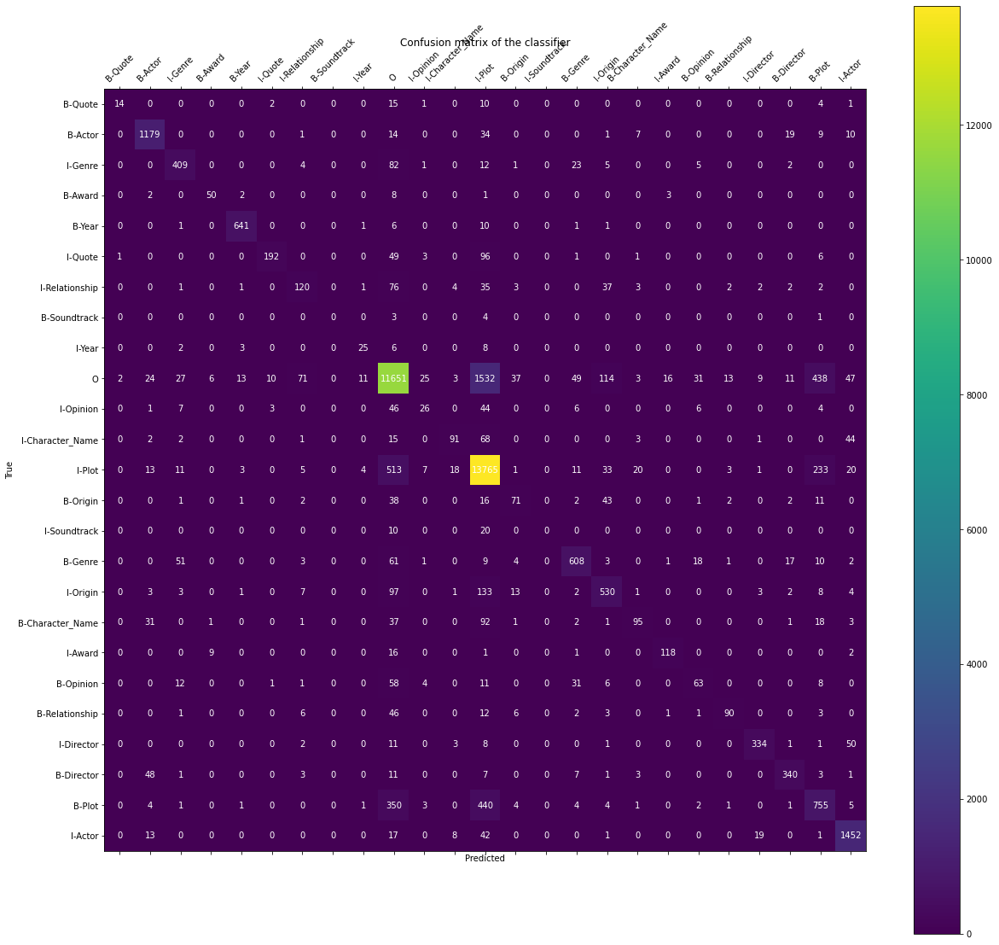

In [24]:
confusion_matrix_heatmap(y_test, preds)

# 1. Split the training data into 80% training, 20% development set (5 marks)
Split the training data (`training_data`) into two lists: one split of the first 80% of the instances of `training_data`, which you will use for training your CRF, and the remaining 20% for testing. Once you've done this re-run the above code such that the tagger is trained on the 80% split and tested on the 20% split, and you obtain the classification report output and confusion heatmap output for the results of testing.

Note: do not use the test data as it is above for testing/viewing results, for now, only the 20% development split just described. Record the results by saving the classification report output as a string somewhere in the notebook for future reference as you go through.


# 2. Error analysis 1: False positives (10 marks)

Performing error analyses is a key part of improving your NLP applications. 

For the 5 classes/labels which have the lowest precision score, according to the results table from your 20% development data, print out all the instances (both the words and the corresponding predicted and ground-truth labels) where there is a false positive for that class in the sequence (i.e. a false positive is where the label is predicted for a given word by the tagger, but this is not present in the corresponding ground truth label for that word). Format the printed sequences to make it as clear as possible where the error is in the sequence for a given label. 

HINT: This may be achieved most easily by editing the code above beginning `print("testing tagger...")` and ending `print("done")`. While this is thinking ahead in preparation for Question 5, and not part of the marks here, have a look at these errors closely, and think about which features could be added to reduce the number of these errors.


# 3. Error analysis 2: False negatives (10 marks)

For the 5 classes/labels which have the lowest recall, according to the results table from your 20% development data, print out all the instances (both the words and corresponding predicted and ground-truth labels for the instance), where there is a false negative for that label (i.e. a false negative is when the the label is the ground-truth label for a given word, but that label is not predicted for that word by the tagger). Format the printed sequences to make it as clear as possible where the error is in the sequence for a given label. 

HINT: As per Q2, his may most easily be achieved by editing the code above beginning `print("testing tagger...")` and ending `print("done")`. While this is thinking ahead in preparation for Question 5, and not part of the marks here, have a look at these errors closely, and think about which features could be added to reduce the number of these errors.

# 4. Using POS tags as features (15 marks)
Use the part-of-speech (POS) tagger (also a CRF tagger object) as shown below to add POS tags to the words in the training data. Do this by altering the `preProcess` function above.

Note the CRF tagger only takes strings as input so you will have to concatenate the word and POS tag together (with a special symbol, e.g. @), and you will also have to then split on this special symbol in the feature extraction function `get_features` to get the word and POS tag - modify that function so it uses the POS tag in addition to the word (currently using the word only is achieved by `feature_list.append("WORD_" + token)`.

Once you're happy you've integrated POS tagging, re-run the training and testing code on your 80%/20% training/dev split you made in Question 1 and record the results from the classification report as text in this file. Compare the accuracy metrics against the original testing you did in Questions 1-3 when not using POS tags- try to see any improvements across the classes (there may not be substantial improvement overall, but some classes will have improved).

In [125]:
# a postagger for use in exercises
posttagger = CRFTagger()
posttagger.set_model_file("crf_pos.tagger")
# example use:
words = ["john", "likes", "mary", "and", "bill"]
tagged = posttagger.tag(words)
print(tagged)

[('john', 'NNP'), ('likes', 'VBZ'), ('mary', 'JJ'), ('and', 'CC'), ('bill', 'NN')]


In [21]:
res = [tag[0]+'@'+tag[1] for tag in tagged]
res

['john@NNP', 'likes@VBZ', 'mary@JJ', 'and@CC', 'bill@NN']

# 5. Feature experimentation for optimal macro average (20 marks).
Experiment with different features by further adjusting the `get_features` function, and modifying it to get the best results in terms of `macro average f-score` (i.e. average f-score across all classes, rather than just raw accuracy or weighted f-score) on your 20% development data. 

Iteratively try different functions, briefly describe the method and record the results in the classification report format. In terms of feature experimentation, you could try using more suffixes/prefixes of the current word than those currently extracted and you could use windows of the next and previous tokens (of different sizes, e.g. the previous/next N words/tags). As you try different feature functions, use the techniques you used in Q2 and Q3 to see the kind of errors you are getting for lower performing classes, in addition to the confusion matrix over classes.

For submission, leave the `get_features` functions in the state you used to get the highest `macro average f-score` on your 20% development set, then re-train the model on ALL the training data and print the classification report for the original test data (i.e. reading in and preprocessing the data from the test file `trivia10k13test.bio.txt`) as your final piece of code. You should not run the model on the test data during development, but only test it right at the end before submission.